# Script to compare values from the Brink results

In [1]:
from brokenaxes import brokenaxes
import cmocean as cmo
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import ticker
import pylab as pl
import numpy as np
import scipy as sc
import scipy.io as sio
import scipy.signal as sig
import pandas as pd
import seaborn as sns
import xarray as xr
from xmitgcm import open_mdsdataset
from math import radians, cos, sin, asin, sqrt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
def get_Brink(file_fig,file_h): #, file_ratio):
    # Brink mode
    file = sio.loadmat(file_fig)
    z, xpl, xxx, zzz = file['z'][0,:], file['xpl'][0,:], file['xxx'][0,:], file['zzz'][0,:]
    k, omega = file['wavenumber'][0][0], file['frequency'][0][0]

    # (u is cross-shore and v is alongshore in Brink.)
    p0, u0, v0, w0, r0 = file['p'], file['u'],file['v'], file['wvel'], file['rho']

    #file_rfw = sio.loadmat(file_ratio)
    #R = file_rfw['ratio_for_wave'][0][0]
    #print('ratio for wave', R)
    #print('k (rad/cm) ', k)
    #print('lambda (km) ', ((2*np.pi)/(k*100))*1E-3)
    #print('omega (rad/s) ', omega)
    #print('period (days)', ((2*np.pi)/omega)/(3600*24))
    #print('c (m/s)', (omega/(k*100)))
    scale=0.2
    w = w0.transpose() * 0.01 * scale # cms-1 to ms-1 and normalization (?)
    u = u0.transpose() * 0.01 * scale # cms-1 to ms-1 and normalization 
    v = v0.transpose() * 0.01 * scale # cms-1 to ms-1 and normalization 
    r = r0.transpose() * 1.0 * scale # mg/cm³ to kg/m³ and normalization
    p = p0.transpose() * 0.1 * scale # dyn/cm² to 0.1 Pa (or kg m-1 s-2) and normalization
    
    hfile=sio.loadmat(file_h)
    h=hfile['h']
    nn=120
    mm=20
    xgr = np.zeros((nn-2,mm-2))
    zgr =  np.zeros((nn-2,mm-2))
    xmax=max(xpl)
    xmax = xmax*1.0e05
    dt = 1/(mm-3)
    dx = xmax/(nn-3)
    for n in np.arange(0,nn-2,1):
        xtemp = dx*n
        xgr[n,:] = (xtemp*np.ones(mm-2))/1e5
        zgr[n,:] = h[0,n]*(-1+dt*np.arange(0,mm-2,1))/100
    
    #z[0:-1]=-np.log10(-z[0:-1])
    #zzz=-np.log10(-zzz)
    return(u,v,w,r,p,z,k,omega,xpl, xxx, zzz,zgr.transpose(),xgr.transpose(),h)


def get_Brinkallmodes2gether(file_fig1,file_fig2,file_fig3,file_fig4): #, file_ratio):
    u1,v1,w1,r1,p1,z,k,f,xpl,xxx,zzz = get_Brink(file_fig1)
    u2,v2,w2,r2,p2,z,k,f,xpl,xxx,zzz = get_Brink(file_fig2)
    u3,v3,w3,r3,p3,z,k,f,xpl,xxx,zzz = get_Brink(file_fig3)
    u4,v4,w4,r4,p4,z,k,f,xpl,xxx,zzz = get_Brink(file_fig4)
    u=u1+u2+u3+u4
    v=v1+v2+v3+v4
    w=w1+w2+w3+w4
    p=p1+p2+p3+p4

    
    return(u,v,w,r,p,z,k,f,xpl, xxx, zzz)

In [6]:
def loadNetCDFs(varname):
    dsw=[]
    dsn=[]
    for i in np.arange(0,8,1):
        
        if varname=='DYNVARS':
            pathn='/media/amelia/Trillian/SVB/exp06_512x612x100_ORL/01_noSVB_febTS/'+ str(varname)+'noSVB'+ str(2+i)+'_'+ str(3+i) +'.nc'
            pathw='/media/amelia/Trillian/SVB/exp06_512x612x100_ORL_SVB/01_SVB_febTS/'+ str(varname)+'withSVB'+ str(2+i)+'_'+ str(3+i) +'.nc'
        else:
            pathn='/media/amelia/Trillian/SVB/exp06_512x612x100_ORL/01b_noSVB_febTS/'+ str(varname)+'noSVB'+ str(2+i)+'_'+ str(3+i) +'.nc'
            pathw='/media/amelia/Trillian/SVB/exp06_512x612x100_ORL_SVB/01b_SVB_febTS/'+ str(varname)+'withSVB'+ str(2+i)+'_'+ str(3+i) +'.nc'
                
        dswin  = xr.open_dataset(pathw)
        dsnin = xr.open_dataset(pathn)
        
        dsw.append(dswin)
        dsn.append(dsnin)
        
    return dsw, dsn


In [7]:
dsw,dsn=loadNetCDFs('DYNVARS')

In [8]:
dswPhyd,dsnPhyd=loadNetCDFs('PHIHYD') #CHANGE TO b file

In [ ]:
dswPbot,dsnPbot=loadNetCDFs('PHIBOT')

## Filtering

In [9]:
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = sig.butter(order, normal_cutoff, btype='bandpass', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = sig.lfilter(b, a, data)
    return y

In [10]:
def filtering(dsw,dsn,indlon,ind):
    order = 5
    fs = 1/1200       
    cutoff =np.array([1/432000, 1/43200])
    
    var23=dsw[0].UVEL[:,:71,ind,indlon].values
    print('1')
    var34=dsw[1].UVEL[:,:71,ind,indlon].values
    print('2')
    var45=dsw[2].UVEL[:,:71,ind,indlon].values
    print('3')
    var56=dsw[3].UVEL[:,:71,ind,indlon].values
    print('4')
    var67=dsw[4].UVEL[:,:71,ind,indlon].values
    print('5')
    var78=dsw[5].UVEL[:,:71,ind,indlon].values
    print('6')
    var89=dsw[6].UVEL[:,:71,ind,indlon].values
    print('7')
    var910=dsw[7].UVEL[:,:71,ind,indlon].values
    print('8')
    
    VALb=np.concatenate((var23, var34, var45, var56,var67,var78,var89, var910), axis=0)# , ,var910), axis=0) 
    
    var23n=dsn[0].UVEL[:,:71,ind,indlon].values
    print('1')
    var34n=dsn[1].UVEL[:,:71,ind,indlon].values
    print('2')
    var45n=dsn[2].UVEL[:,:71,ind,indlon].values
    print('3')
    var56n=dsn[3].UVEL[:,:71,ind,indlon].values                 
    print('4')
    var67n=dsn[4].UVEL[:,:71,ind,indlon].values
    print('5')
    var78n=dsn[5].UVEL[:,:71,ind,indlon].values
    print('6')
    var89n=dsn[6].UVEL[:,:71,ind,indlon].values
    print('7')
    var910n=dsn[7].UVEL[:,:71,ind,indlon].values
    print('8')
    
    VALn=np.concatenate((var23n, var34n, var45n, var56n,var67n,var78n,var89n, var910n), axis=0) #, var910n), axis=0) 
    VALdif=VALb-VALn
    VALfilt=np.zeros(np.shape(VALdif))
    p=0
    
    for dep in np.arange(np.size(VALdif,1)):
        p=0
        for d in np.arange(np.size(indlon)):
            data = VALdif[:,dep,d]
            # Filtering and plotting
            p=p+1
            VALfilt[:,dep,p-1] = butter_lowpass_filter(data, cutoff, fs, order)
    
    return VALfilt

In [ ]:
indlon30=np.arange(336,403,1)
indlon307=np.arange(289,385,1)
indlon314=np.arange(268,352,1)
indlon32=np.arange(264,333,1)


ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N

indlon=indlon32
ind=ind32



Ufilt=filtering(dsw,dsn,indlon,ind)
np.save("UVEL32filt.npy",Ufilt)

In [20]:
data_dirWITH= '/media/amelia/Trillian/SVB/exp06_512x612x100_ORL_SVB/01b_SVB_febTS/'
data_dirNO= '/media/amelia/Trillian/SVB/exp06_512x612x100_ORL/01b_noSVB_febTS/'

In [11]:
def filteringPressure(dsw,dsn,indlon,ind):
    order = 5
    fs1 = 1/600
    fs = 1/1200       
    cutoff =np.array([1/432000, 1/43200])
    
    var23=dsw[0].PHIHYD[:,:71,ind,indlon].values
    print('1')
    var34=dsw[1].PHIHYD[:,:71,ind,indlon].values
    print('2')
    var45=dsw[2].PHIHYD[:,:71,ind,indlon].values
    print('3')
    var56=dsw[3].PHIHYD[:,:71,ind,indlon].values
    print('4')
    var67=dsw[4].PHIHYD[:,:71,ind,indlon].values
    print('5')
    var78=dsw[5].PHIHYD[:,:71,ind,indlon].values
    print('6')
    var89=dsw[6].PHIHYD[:,:71,ind,indlon].values
    print('7')
    var910=dsw[7].PHIHYD[:,:71,ind,indlon].values
    print('8')
    
    VALb=np.concatenate((var23, var34, var45, var56,var67,var78,var89, var910), axis=0)# , ,var910), axis=0) 
    
    var23n=dsn[0].PHIHYD[:,:71,ind,indlon].values
    print('1')
    var34n=dsn[1].PHIHYD[:,:71,ind,indlon].values
    print('2')
    var45n=dsn[2].PHIHYD[:,:71,ind,indlon].values
    print('3')
    var56n=dsn[3].PHIHYD[:,:71,ind,indlon].values                 
    print('4')
    var67n=dsn[4].PHIHYD[:,:71,ind,indlon].values
    print('5')
    var78n=dsn[5].PHIHYD[:,:71,ind,indlon].values
    print('6')
    var89n=dsn[6].PHIHYD[:,:71,ind,indlon].values
    print('7')
    var910n=dsn[7].PHIHYD[:,:71,ind,indlon].values
    print('8')
    
    VALn=np.concatenate((var23n, var34n, var45n, var56n,var67n,var78n,var89n, var910n), axis=0) #, var910n), axis=0) 
    index=np.zeros(576)
    index[:216]=np.arange(0,432,2)
    index[216:]=np.arange(432,792,1)

    VALdif=VALb[index.astype(int),:]-VALn[index.astype(int),:]
    VALfilt=np.zeros(np.shape(VALdif))
    p=0
    
    for dep in np.arange(np.size(VALdif,1)):
        p=0
        for d in np.arange(np.size(indlon)):
            data = VALdif[:,dep,d]
            # Filtering and plotting
            p=p+1
            VALfilt[:,dep,p-1] = butter_lowpass_filter(data, cutoff, fs, order)
    
    return VALfilt

In [12]:
ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N

ind=ind30
lon=30

hFacC = dsw[0].hFacC
hfac = np.ma.masked_values(hFacC, 0)
mask = np.ma.getmask(hfac)

LON = dsn[0].XC[mask[0,ind,:]==False]-360

distance=cos((lon*np.pi)/180)*111*-1*(LON-LON[-1])

indlonpre=np.where(distance<=103)
indlon=indlonpre[0]
#actual distance from the coast
dist=distance[indlon]



Pfilt30=filteringPressure(dswPhyd,dsnPhyd,indlon,ind)

1
2
3
4
5
6
7
8
1
2
3
4
5
6
7
8


In [13]:
np.save("PHIHYD30filt.npy",Pfilt30)

### Define other variables

In [15]:
LAT = dsn[0].YC
LON1 = dsn[0].XC[:403]-360
LON2 = dsn[0].XC[:385]-360
LON3 = dsn[0].XC[:352]-360
LON4 = dsn[0].XC[:333]-360

distance30=cos((30*np.pi)/180)*111*-1*(LON1-LON1[-1])
distance307=cos((30.7*np.pi)/180)*111*-1*(LON2-LON2[-1]) 
distance314=cos((31.4*np.pi)/180)*111*-1*(LON3-LON3[-1])
distance32=cos((32*np.pi)/180)*111*-1*(LON4-LON4[-1])


indlon30pre=np.where(distance30<=100)
indlon307pre=np.where(distance307<=100)
indlon314pre=np.where(distance314<=100)
indlon32pre=np.where(distance32<=100)


indlon30=336
indlon307=289
indlon314=268
indlon32=264

dist30=distance30[indlon30:]
dist307=distance307[indlon307:]
dist314=distance314[indlon314:]
dist32=distance32[indlon32:]

ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N

Z = dsw[0].Z[:71]
TIME=dsw[0].time
time=np.arange(2880,17280,2200)
nt = np.size(TIME)

maskWVEL=dsw[0].maskInW==False
maskwn=dsn[0].maskInW==False

nx = 512
ny = 612
nz = 100

In [57]:
def unfilteredPLOT(dsw,dsn,ind,lon):

    hFacC = dsw[0].hFacC
    hfac = np.ma.masked_values(hFacC, 0)
    mask = np.ma.getmask(hfac)

    LON = dsn[0].XC[mask[0,ind,:]==False]-360

    distance=cos((lon*np.pi)/180)*111*-1*(LON-LON[-1])

    indlonpre=np.where(distance<=103)
    indlon=indlonpre[0]
    #actual distance from the coast
    dist=distance[indlon]

    #DEFINE IF IT IS FILTERED DATA OR NOT 
    filt=0


    fig0, ax = plt.subplots(1,4,sharey=True)
    fig0.suptitle('Day 2', fontsize=36)
    VALb=dsw[0].VVEL
    VALn=dsn[0].VVEL

    WALb=dsw[0].WVEL
    WALn=dsn[0].WVEL

    UALb=dsw[0].UVEL
    UALn=dsn[0].UVEL

    PALb=dswPhyd[0].PHIHYD
    PALn=dsnPhyd[0].PHIHYD

    WAL=0
    UAL=0
    VAL=0


    plot_vel(time0,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig0,ax,1,VAL,UAL,WAL,PAL,filt)
    fig0.tight_layout()

    fig1, ax = plt.subplots(1,4,sharey=True)
    fig1.suptitle('Day 3', fontsize=36)
    VALb=dsw[1].VVEL
    VALn=dsn[1].VVEL

    WALb=dsw[1].WVEL
    WALn=dsn[1].WVEL

    UALb=dsw[1].UVEL
    UALn=dsn[1].UVEL

    PALb=dswPhyd[1].PHIHYD
    PALn=dsnPhyd[1].PHIHYD


    plot_vel(time1,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig1,ax,1,VAL,UAL,WAL,PAL,filt)
    fig1.tight_layout()

    fig2, ax = plt.subplots(1,4,sharey=True)
    fig2.suptitle('Day 4', fontsize=36)
    VALb=dsw[2].VVEL
    VALn=dsn[2].VVEL

    WALb=dsw[2].WVEL
    WALn=dsn[2].WVEL

    UALb=dsw[2].UVEL
    UALn=dsn[2].UVEL

    PALb=dswPhyd[2].PHIHYD
    PALn=dsnPhyd[2].PHIHYD

    plot_vel(time2,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig2,ax,1,VAL,UAL,WAL,PAL,filt)
    fig2.tight_layout()

    fig3, ax = plt.subplots(1,4,sharey=True)
    fig3.suptitle('Day 5', fontsize=36)
    VALb=dsw[3].VVEL
    VALn=dsn[3].VVEL

    WALb=dsw[3].WVEL
    WALn=dsn[3].WVEL

    UALb=dsw[3].UVEL
    UALn=dsn[3].UVEL

    PALb=dswPhyd[3].PHIHYD
    PALn=dsnPhyd[3].PHIHYD


    plot_vel(time3,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig3,ax,1,VAL,UAL,WAL,PAL,filt)
    fig3.tight_layout()

    fig4, ax = plt.subplots(1,4,sharey=True)
    fig4.suptitle('Day 6', fontsize=36)
    VALb=dsw[4].VVEL
    VALn=dsn[4].VVEL

    WALb=dsw[4].WVEL
    WALn=dsn[4].WVEL

    UALb=dsw[4].UVEL
    UALn=dsn[4].UVEL

    PALb=dswPhyd[4].PHIHYD
    PALn=dsnPhyd[4].PHIHYD


    plot_vel(time4,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig4,ax,1,VAL,UAL,WAL,PAL,filt)
    fig4.tight_layout()


    fig5, ax = plt.subplots(1,4,sharey=True)
    fig5.suptitle('Day 7', fontsize=36)
    VALb=dsw[5].VVEL
    VALn=dsn[5].VVEL

    WALb=dsw[5].WVEL
    WALn=dsn[5].WVEL

    UALb=dsw[5].UVEL
    UALn=dsn[5].UVEL

    PALb=dswPhyd[5].PHIHYD
    PALn=dsnPhyd[5].PHIHYD

    plot_vel(time5,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig5,ax,1,VAL,UAL,WAL,PAL,filt)
    fig5.tight_layout()

    fig6, ax = plt.subplots(1,4,sharey=True)
    fig6.suptitle('Day 8', fontsize=36)
    VALb=dsw[6].VVEL
    VALn=dsn[6].VVEL

    WALb=dsw[6].WVEL
    WALn=dsn[6].WVEL

    UALb=dsw[6].UVEL
    UALn=dsn[6].UVEL

    PALb=dswPhyd[6].PHIHYD
    PALn=dsnPhyd[6].PHIHYD


    plot_vel(time6,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig6,ax,1,VAL,UAL,WAL,PAL,filt)
    fig6.tight_layout()

    fig7, ax = plt.subplots(1,4,sharey=True)
    fig7.suptitle('Day 9', fontsize=36)
    VALb=dsw[7].VVEL
    VALn=dsn[7].VVEL

    WALb=dsw[7].WVEL
    WALn=dsn[7].WVEL

    UALb=dsw[7].UVEL
    UALn=dsn[7].UVEL

    PALb=dswPhyd[7].PHIHYD
    PALn=dsnPhyd[7].PHIHYD


    plot_vel(time7,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig7,ax,1,VAL,UAL,WAL,PAL,filt)
    fig7.tight_layout()


In [43]:

def plot_vel(timey,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig,ax,k,VAL,UAL,WAL,PAL,filt): 


    
    if filt == 0:
        welb3=WALb[0,:71,ind,indlon].values
        weln3=WALn[0,:71,ind,indlon].values
    
        velb1=VALb[0,:71,ind,indlon].values
        veln1=VALn[0,:71,ind,indlon].values #30: indlon:403 30.7: indlon:385 31.4: indlon:352 32: indlon:333

        uelb2=UALb[0,:71,ind,indlon].values
        ueln2=UALn[0,:71,ind,indlon].values
        
        pelb4=PALb[0,:71,ind,indlon].values
        peln4=PALn[0,:71,ind,indlon].values
        
        
        plot_side(ax[0],dist,Z,(velb1-veln1)*1000,k,'Alongshore velocity [mm/s]',fig,cmo.cm.curl,0,'%.1f',indlon,ind)
        plot_side(ax[1],dist,Z,(uelb2-ueln2)*1000,k,'Crossshore velocity [mm/s]',fig,cmo.cm.curl,0,'%.1f',indlon,ind)
        plot_side(ax[2],dist,Z,(welb3-weln3)*1000,k,'Vertical velocity [mm/s]',fig,cmo.cm.curl,0,'%.3f',indlon,ind)
        plot_side(ax[3],dist,Z,(pelb4-peln4)*100,k,'Pressure [$dm^2/s^2$]',fig,cmo.cm.delta,1,'%.2f',indlon,ind)
        
    else:
        plot_side(ax[0],dist,Z,VAL*1000,k,'Alongshore velocity [mm/s]',fig,cmo.cm.curl,0,'%.1f',indlon,ind)
        plot_side(ax[1],dist,Z,UAL*1000,k,'Crossshore velocity [mm/s]',fig,cmo.cm.curl,0,'%.1f',indlon,ind)
        plot_side(ax[2],dist,Z,WAL*1000,k,'Vertical velocity [mm/s]',fig,cmo.cm.curl,0,'%.3f',indlon,ind)
        plot_side(ax[3],dist,Z,PAL*100,k,'Pressure [$dm^2/s^2$]',fig,cmo.cm.delta,1,'%.2f',indlon,ind)


    
    
    ax[0].set(ylabel='Depth [m]')


In [39]:
def plot_side(ax,LON,Z,VAL,n,title2,fig,cmapi,p,fmt,indlon,ind):
    
   # if n==1:
        #title='30°N'
    #    latind=0
     #   indlon=np.arange(336,403,1)
    #elif n==2:
        #title='30.7°N'
     #   latind=50
      #  indlon=np.arange(289,385,1)
    #elif n==3:
     #   #title='31.4°N'
      #  latind=100
      #  indlon=np.arange(268,352,1)
   # elif n==4:
        #title='32°N'
   #     latind=150
    #    indlon=np.arange(264,333,1)


    hFacC = dsw[0].hFacC
    hfac = np.ma.masked_values(hFacC[:71,ind,indlon], 0)
    mask = np.ma.getmask(hfac)
    mask2=mask==False
    xlab='Crosshore distance [km]'
    ylab='Depth [m]'
    maxv =np.nanmax(abs(VAL))#+1.6e-5# for w:-1.6e-5
    minv =-maxv # for w:1.6e-5
    ax.set_facecolor('tan')
    nlev=15
    if p==1:
        levels=np.linspace(np.nanmin(VAL),np.nanmax(VAL),nlev)
        cax = ax.contourf(LON, Z,np.ma.masked_array(VAL, mask=mask), levels=levels, cmap=cmapi,  zorder=1)
    else:
        levels=np.linspace(minv,maxv,nlev)
        cax = ax.contourf(LON, Z,np.ma.masked_array(VAL,mask=mask), levels=levels, cmap=cmapi, vmin=minv, 
                      vmax=maxv, zorder=1)
       # ax.contourf(LON, Z,np.ma.masked_array(VAL,mask=mask2),cmap='OrRd')
        
        
    ax.contour(LON, Z,np.ma.masked_array(VAL, mask=mask), levels=[0], linewidths=2, 
               linestyles='-', colors='k', zorder=2)
    ax.contour(LON, Z,np.ma.masked_array(VAL, mask=mask), levels=levels, linewidths=1, 
               linestyles='-', colors='k', zorder=2)
    #ax.set_title(title)
    ax.set(xlabel=xlab)
    
    cbar_ax = fig.colorbar(cax, ax=ax,format=fmt)
    
    cbar_ax.set_label(title2)
    
    #cbar_ax = fig.add_axes([0.95, 0.15, 0.03, 0.7])
    #fig.colorbar(cax, cax=cbar_ax)
    #cbar_ax.set_ylabel(title2)
        
   
    

In [11]:
def plot_Brink(ax2,ax3,ax4,ax5,u,v,w,p,z,xpl,xxx,zzz,minp,maxp,nlev=15):
    landc='tan'
    ymin=z[0]
    levels=np.linspace(minp,maxp,nlev)
    p5 = ax5.contourf(xpl, z, p, levels=levels, cmap=cmo.cm.delta, vmin=minp, 
                      vmax=maxp, zorder=1)
    ax5.contour(xpl, z, p, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    ax5.contour(xpl, z, p, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax5.fill_between(xxx, zzz.min(), zzz, facecolor=landc, zorder=3)
    ax5.set_ylim([ymin,0])
    cbar5 = plt.colorbar(p5,ax=ax5)
    cbar5.set_label('Pressure [arbitrary units]')
    
    levels=np.linspace(np.nanmin(w),-np.nanmin(w),nlev)
    p4 = ax4.contourf(xpl, z, w, levels=levels, cmap=cmo.cm.curl, vmin=np.nanmin(w), 
                      vmax=-np.nanmin(w), zorder=1)
    ax4.contour(xpl, z, w, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    ax4.contour(xpl, z, w, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax4.fill_between(xxx, zzz.min(), zzz, facecolor=landc, zorder=3)
    ax4.set_ylim([ymin,0])
    cbar4 = plt.colorbar(p4,ax=ax4)
    cbar4.set_label('Vertical velocity [cm/s]')
    
    levels=np.linspace(np.nanmin(v),-np.nanmin(v),nlev)
    
    p2 = ax2.contourf(xpl, z,  v, levels=levels, cmap=cmo.cm.curl, vmin=np.nanmin(v),
                      vmax=-np.nanmin(v), zorder=1)
    ax2.contour(xpl, z, v, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    ax2.contour(xpl, z, v, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax2.fill_between(xxx, zzz.min(), zzz, facecolor=landc, zorder=3)
    ax2.set_ylim([ymin,0])
    cbar2 = plt.colorbar(p2,ax=ax2)
    cbar2.set_label('Along-shelf velocity [cm/s]')
    
    levels=np.linspace(-np.nanmax(u),np.nanmax(u),nlev)
    p3 = ax3.contourf(xpl, z, u, levels=levels, cmap=cmo.cm.curl, vmin=-np.nanmax(u),
                      vmax=np.nanmax(u), zorder=1)
    ax3.contour(xpl, z, u, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    ax3.contour(xpl, z, u, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax3.fill_between(xxx, zzz.min(), zzz, facecolor=landc, zorder=3)
    ax3.set_ylim([ymin,0])
    cbar3 = plt.colorbar(p3,ax=ax3)
    cbar3.set_label('Cross shelf velocity [cm/s]')

In [12]:
params = {'font.size': 28,
          'figure.figsize': (25, 8),
         'font.family':'serif'}
pl.rcParams.update(params)

# 30 degrees north

### Filtered data

IndexError: tuple index out of range

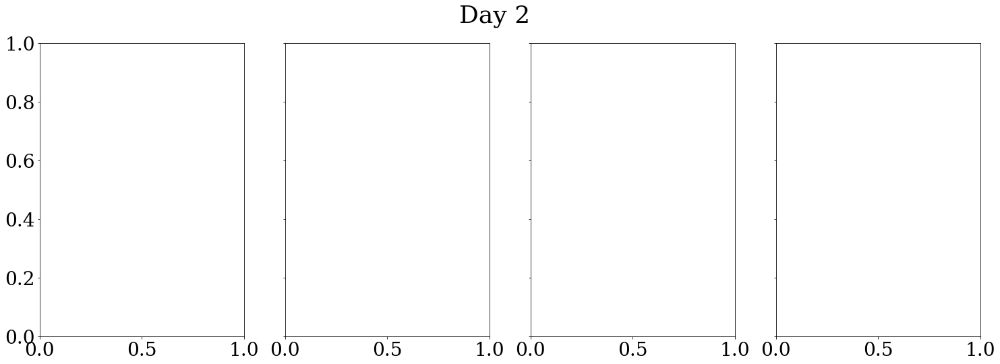

In [44]:
time0=0 #Day 2.5
time1=144 # Day 3.5
time2=288 # Day 4
time3=432 # Day 5
time4=504 #Day 6
time5=576 #Day 7 Day 8 for pressure
time6=648 #Day 8 Day 10 for pressure
time7=720 #Day 9

tit=72

ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N

ind=ind30

hFacC = dsw[0].hFacC
hfac = np.ma.masked_values(hFacC, 0)
mask = np.ma.getmask(hfac)

LON = dsn[0].XC[mask[0,ind,:]==False]-360

distance=cos((30*np.pi)/180)*111*-1*(LON-LON[-1])

indlon=np.where(distance<=103)

#actual distance from the coast
dist=distance[indlon]
#indlon=indlon30

#dist=dist30

PALb=0
PALn=0
PREFb=0
PREFn=0

#DEFINE IF IT IS FILTERED DATA OR NOT 
filt=1

Ufilt=np.load("UVEL30filt.npy")
Wfilt=np.load("WVEL30filt.npy")
Vfilt=np.load("VVEL30filt.npy")
Pfilt30=np.load("PHIHYD30filt.npy")

fig0, ax = plt.subplots(1,4,sharey=True)
fig0.suptitle('Day 2', fontsize=36)
VALb=dsw[0].VVEL
VALn=dsn[0].VVEL

WALb=dsw[0].WVEL
WALn=dsn[0].WVEL

UALb=dsw[0].UVEL
UALn=dsn[0].UVEL


WAL=Wfilt[tit*0,:,:]
UAL=Ufilt[tit*0,:,:]
VAL=Vfilt[tit*0,:,:]
PAL=Pfilt30[tit*0,:,:]

plot_vel(time0,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig0,ax,1,VAL,UAL,WAL,PAL,filt)
fig0.tight_layout()

fig1, ax = plt.subplots(1,4,sharey=True)
fig1.suptitle('Day 3', fontsize=36)
VALb=dsw[1].VVEL
VALn=dsn[1].VVEL

WALb=dsw[1].WVEL
WALn=dsn[1].WVEL

UALb=dsw[1].UVEL
UALn=dsn[1].UVEL

WAL=Wfilt[tit*1,:,:]
UAL=Ufilt[tit*1,:,:]
VAL=Vfilt[tit*1,:,:]
PAL=Pfilt30[tit*1,:,:]

plot_vel(time1,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig1,ax,1,VAL,UAL,WAL,PAL,filt)
fig1.tight_layout()

fig2, ax = plt.subplots(1,4,sharey=True)
fig2.suptitle('Day 4', fontsize=36)
VALb=dsw[2].VVEL
VALn=dsn[2].VVEL

WALb=dsw[2].WVEL
WALn=dsn[2].WVEL

UALb=dsw[2].UVEL
UALn=dsn[2].UVEL

WAL=Wfilt[tit*2,:,:]
UAL=Ufilt[tit*2,:,:]
VAL=Vfilt[tit*2,:,:]
PAL=Pfilt30[tit*2,:,:]

plot_vel(time2,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig2,ax,1,VAL,UAL,WAL,PAL,filt)
fig2.tight_layout()

fig3, ax = plt.subplots(1,4,sharey=True)
fig3.suptitle('Day 5', fontsize=36)
VALb=dsw[3].VVEL
VALn=dsn[3].VVEL

WALb=dsw[3].WVEL
WALn=dsn[3].WVEL

UALb=dsw[3].UVEL
UALn=dsn[3].UVEL

WAL=Wfilt[tit*3,:,:]
UAL=Ufilt[tit*3,:,:]
VAL=Vfilt[tit*3,:,:]
PAL=Pfilt30[tit*3,:,:]

plot_vel(time3,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig3,ax,1,VAL,UAL,WAL,PAL,filt)
fig3.tight_layout()

fig4, ax = plt.subplots(1,4,sharey=True)
fig4.suptitle('Day 6', fontsize=36)
VALb=dsw[4].VVEL
VALn=dsn[4].VVEL

WALb=dsw[4].WVEL
WALn=dsn[4].WVEL

UALb=dsw[4].UVEL
UALn=dsn[4].UVEL

WAL=Wfilt[tit*4,:,:]
UAL=Ufilt[tit*4,:,:]
VAL=Vfilt[tit*4,:,:]
PAL=Pfilt30[tit*4,:,:]

plot_vel(time4,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig4,ax,1,VAL,UAL,WAL,PAL,filt)
fig4.tight_layout()


fig5, ax = plt.subplots(1,4,sharey=True)
fig5.suptitle('Day 7', fontsize=36)
VALb=dsw[5].VVEL
VALn=dsn[5].VVEL

WALb=dsw[5].WVEL
WALn=dsn[5].WVEL

UALb=dsw[5].UVEL
UALn=dsn[5].UVEL

WAL=Wfilt[tit*5,:,:]
UAL=Ufilt[tit*5,:,:]
VAL=Vfilt[tit*5,:,:]
PAL=Pfilt30[tit*5,:,:]

plot_vel(time5,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig5,ax,1,VAL,UAL,WAL,PAL,filt)
fig5.tight_layout()

fig6, ax = plt.subplots(1,4,sharey=True)
fig6.suptitle('Day 8', fontsize=36)
VALb=dsw[6].VVEL
VALn=dsn[6].VVEL

WALb=dsw[6].WVEL
WALn=dsn[6].WVEL

UALb=dsw[6].UVEL
UALn=dsn[6].UVEL

WAL=Wfilt[tit*6,:,:]
UAL=Ufilt[tit*6,:,:]
VAL=Vfilt[tit*6,:,:]
PAL=Pfilt30[tit*6,:,:]

plot_vel(time6,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig6,ax,1,VAL,UAL,WAL,PAL,filt)
fig6.tight_layout()

fig7, ax = plt.subplots(1,4,sharey=True)
fig7.suptitle('Day 9', fontsize=36)
VALb=dsw[7].VVEL
VALn=dsn[7].VVEL

WALb=dsw[7].WVEL
WALn=dsn[7].WVEL

UALb=dsw[7].UVEL
UALn=dsn[7].UVEL

WAL=Wfilt[tit*7,:,:]
UAL=Ufilt[tit*7,:,:]
VAL=Vfilt[tit*7,:,:]
PAL=Pfilt30[tit*7,:,:]

plot_vel(time7,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,indlon,ind,fig7,ax,1,VAL,UAL,WAL,PAL,filt)
fig7.tight_layout()


### Unfiltered data

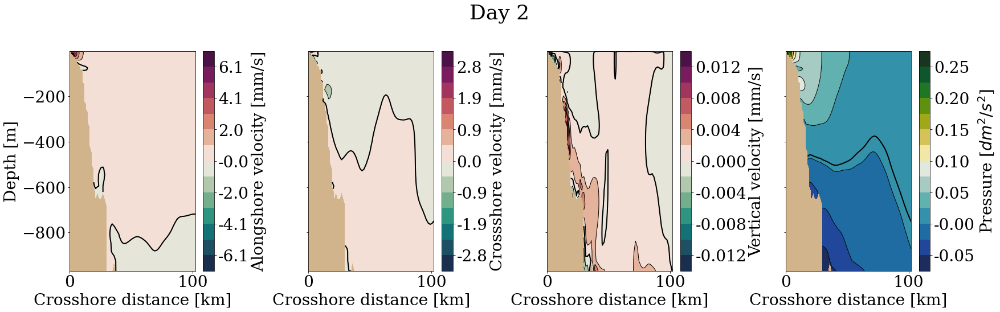

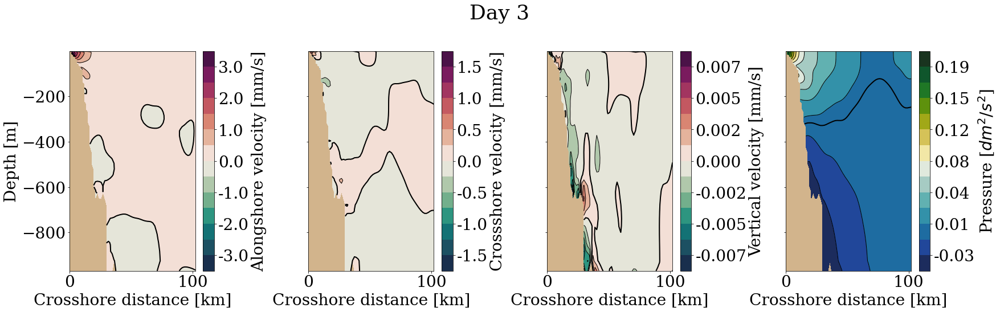

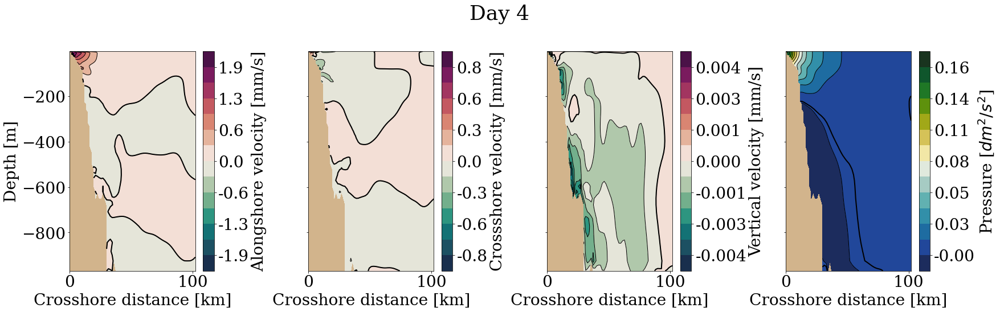

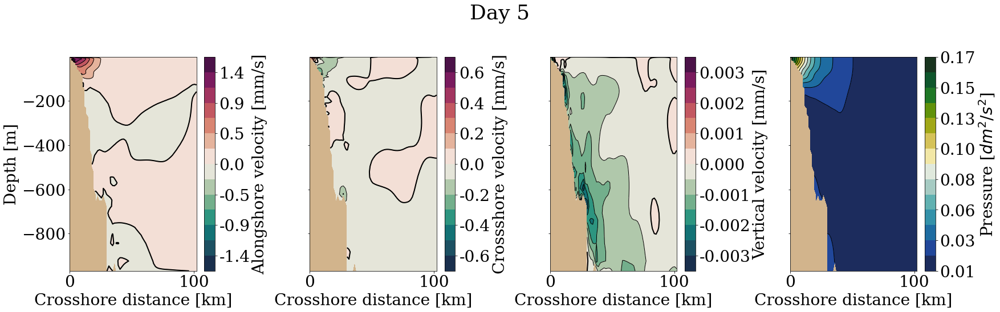

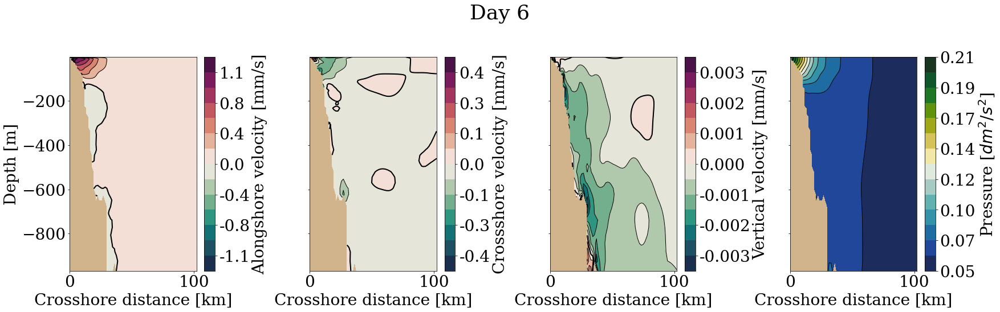

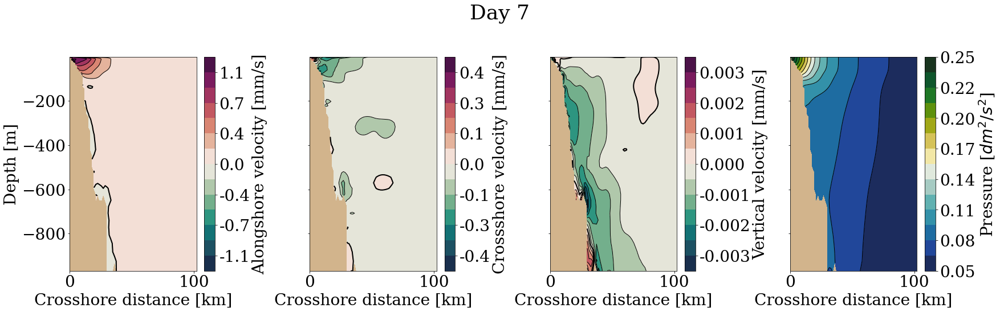

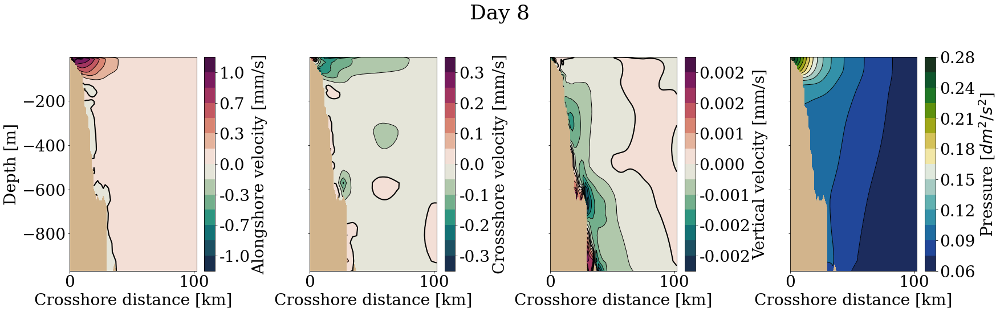

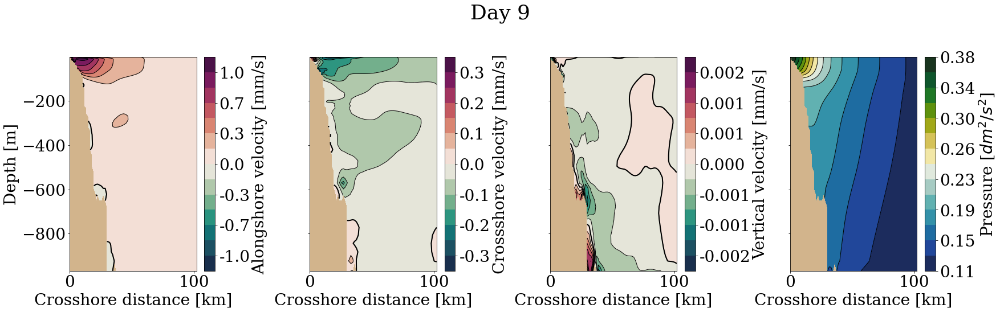

In [62]:
ind=220 #30° N
lon=30
unfilteredPLOT(dsw,dsn,ind,lon)

### Brink data

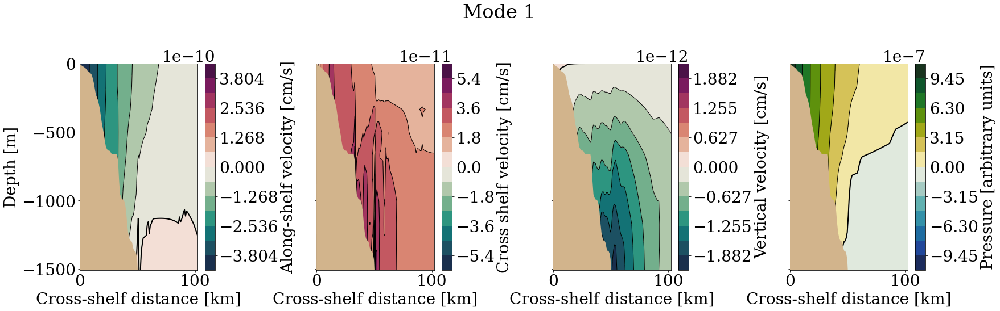

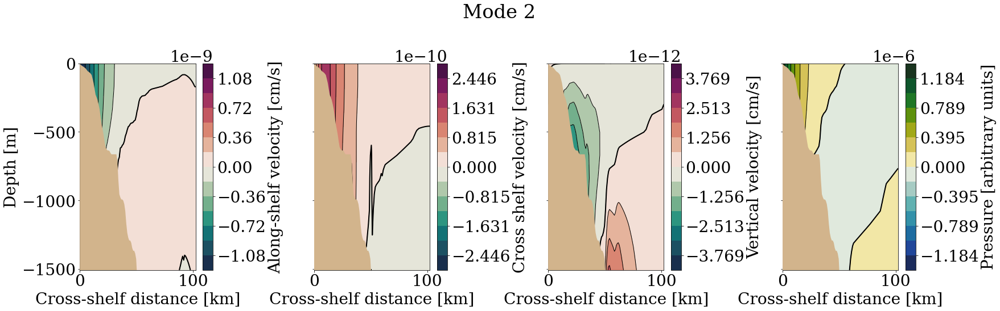

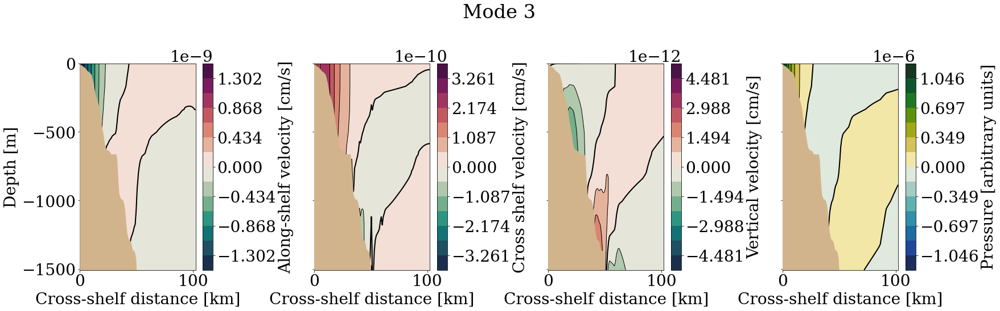

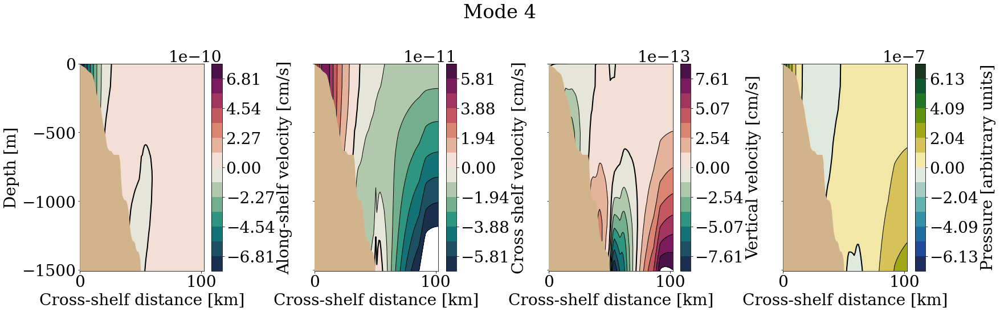

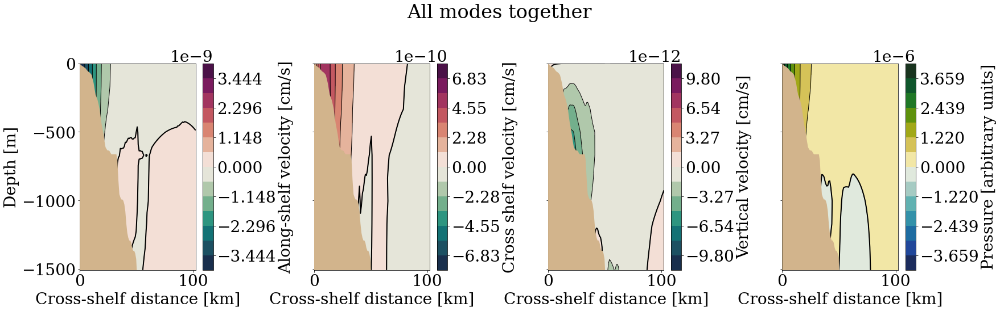

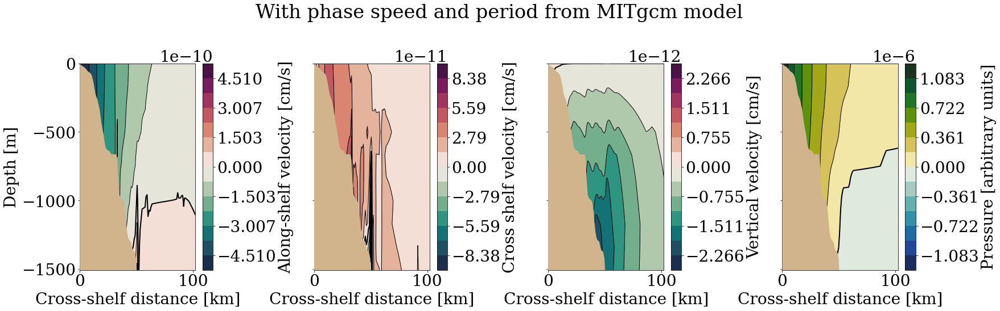

In [8]:
u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30mode1.mat')


fig1, ax = plt.subplots(1,4,sharey=True)
mode=1
fig1.suptitle('Mode 1')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig1.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30mode2.mat')

fig2, ax = plt.subplots(1,4,sharey=True)
mode=2
fig2.suptitle('Mode 2')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig2.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30mode3.mat')

fig3, ax = plt.subplots(1,4,sharey=True)
mode=3
fig3.suptitle('Mode 3')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig3.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30mode4.mat')

fig4, ax = plt.subplots(1,4,sharey=True)
mode=4
fig4.suptitle('Mode 4')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig4.tight_layout()

u,v,w,r,p,z,k,f,xpl,xxx,zzz = get_Brinkallmodes2gether('dataSVB30mode1.mat','dataSVB30mode2.mat'
                                                       ,'dataSVB30mode3.mat','dataSVB30mode4.mat')
fig5, ax = plt.subplots(1,4,sharey=True)
mode='all'
fig5.suptitle('All modes together')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig5.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB301.4mode1.mat')


fig6, ax = plt.subplots(1,4,sharey=True)
mode=1
fig6.suptitle('With phase speed and period from MITgcm model')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig6.tight_layout()

# 30.7 degrees north

### Filtered data

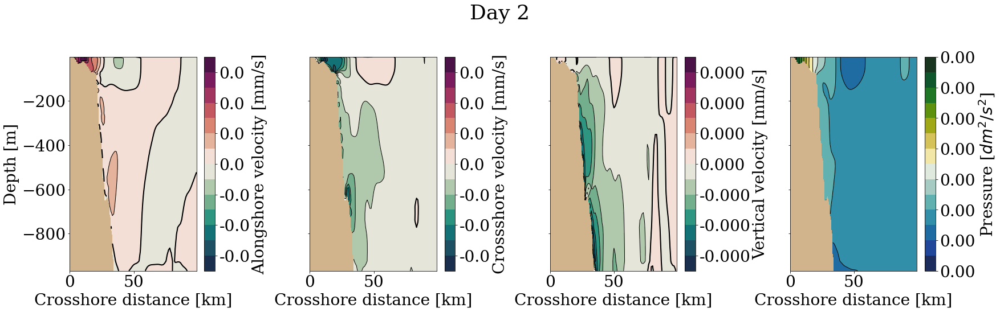

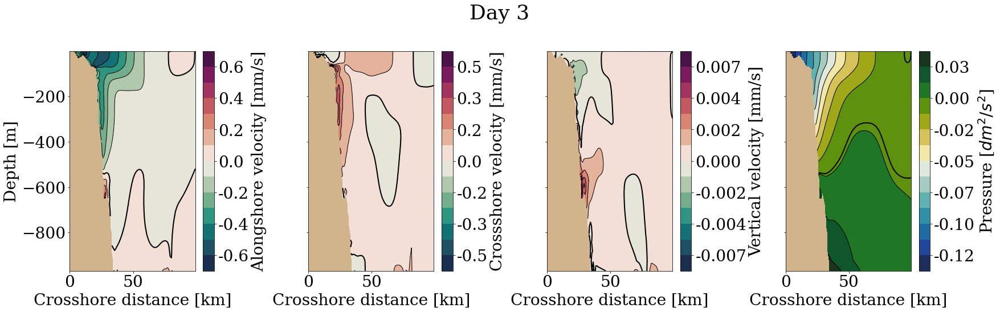

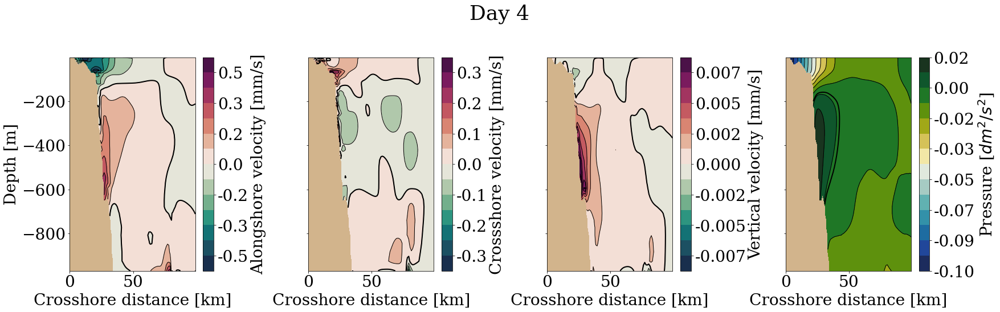

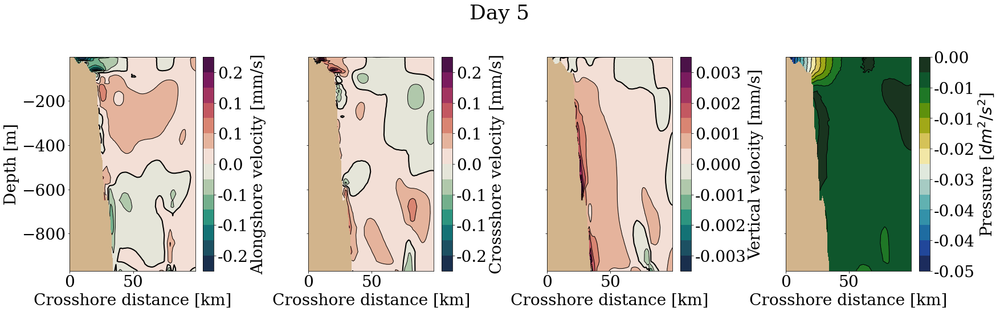

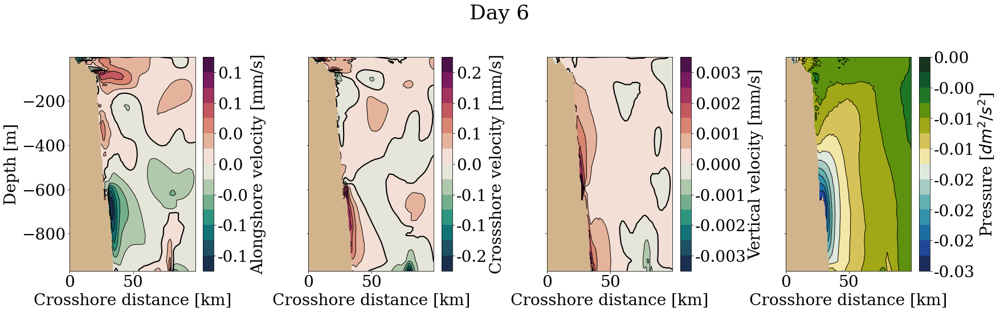

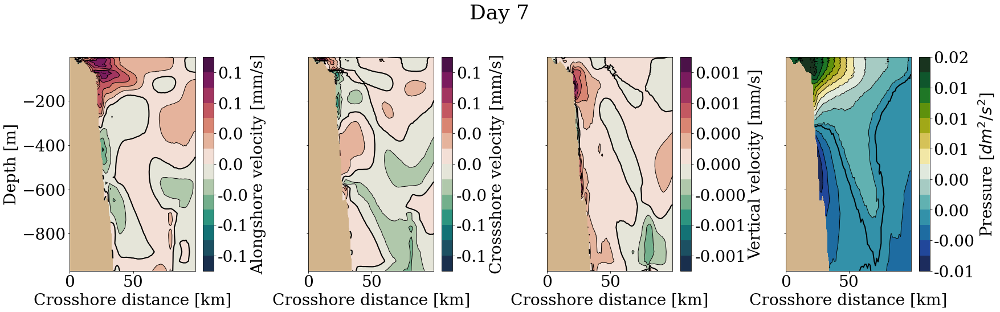

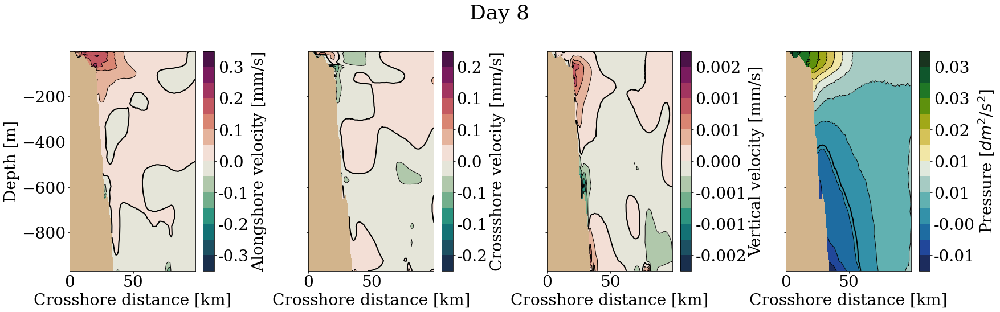

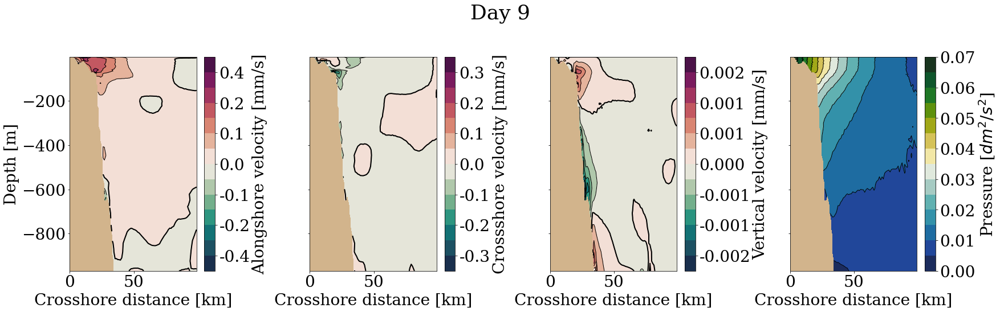

In [25]:
time0=0 #Day 2.5
time1=144 # Day 3.5
time2=288 # Day 4
time3=432 # Day 5
time4=504 #Day 6
time5=576 #Day 7 Day 8 for pressure
time6=648 #Day 8 Day 10 for pressure
time7=720 #Day 9

indlon30=np.arange(336,403,1)
indlon307=np.arange(289,385,1)
indlon314=np.arange(268,352,1)
indlon32=np.arange(264,333,1)

ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N
# 30.7 degrees north
indlon=indlon307
ind=ind307
dist=dist307
#DEFINE IF IT IS FILTERED DATA OR NOT 
filt=1

tit=72

Ufilt=np.load("UVEL307filt.npy")
Wfilt=np.load("WVEL307filt.npy")
Vfilt=np.load("VVEL307filt.npy")
Pfilt307=np.load("PHIHYD307filt.npy")

fig0, ax = plt.subplots(1,4,sharey=True)
fig0.suptitle('Day 2', fontsize=36)
VALb=dsw[0].VVEL
VALn=dsn[0].VVEL

WALb=dsw[0].WVEL
WALn=dsn[0].WVEL

UALb=dsw[0].UVEL
UALn=dsn[0].UVEL

WAL=Wfilt[tit*0,:,:]
UAL=Ufilt[tit*0,:,:]
VAL=Vfilt[tit*0,:,:]
PAL=Pfilt307[tit*0,:,:]

PALb=0
PALn=0
PREFb=0
PREFn=0

plot_vel(time0,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig0,ax,2,VAL,UAL,WAL,PAL,filt)
fig0.tight_layout()

fig1, ax = plt.subplots(1,4,sharey=True)
fig1.suptitle('Day 3', fontsize=36)
VALb=dsw[1].VVEL
VALn=dsn[1].VVEL

WALb=dsw[1].WVEL
WALn=dsn[1].WVEL

UALb=dsw[1].UVEL
UALn=dsn[1].UVEL

WAL=Wfilt[tit*1,:,:]
UAL=Ufilt[tit*1,:,:]
VAL=Vfilt[tit*1,:,:]
PAL=Pfilt307[tit*1,:,:]

plot_vel(time1,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig1,ax,2,VAL,UAL,WAL,PAL,filt)
fig1.tight_layout()

fig2, ax = plt.subplots(1,4,sharey=True)
fig2.suptitle('Day 4', fontsize=36)
VALb=dsw[2].VVEL
VALn=dsn[2].VVEL

WALb=dsw[2].WVEL
WALn=dsn[2].WVEL

UALb=dsw[2].UVEL
UALn=dsn[2].UVEL

WAL=Wfilt[tit*2,:,:]
UAL=Ufilt[tit*2,:,:]
VAL=Vfilt[tit*2,:,:]
PAL=Pfilt307[tit*2,:,:]

plot_vel(time2,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig2,ax,2,VAL,UAL,WAL,PAL,filt)
fig2.tight_layout()

fig3, ax = plt.subplots(1,4,sharey=True)
fig3.suptitle('Day 5', fontsize=36)
VALb=dsw[3].VVEL
VALn=dsn[3].VVEL

WALb=dsw[3].WVEL
WALn=dsn[3].WVEL

UALb=dsw[3].UVEL
UALn=dsn[3].UVEL

WAL=Wfilt[tit*3,:,:]
UAL=Ufilt[tit*3,:,:]
VAL=Vfilt[tit*3,:,:]
PAL=Pfilt307[tit*3,:,:]

plot_vel(time3,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig3,ax,2,VAL,UAL,WAL,PAL,filt)
fig3.tight_layout()

fig4, ax = plt.subplots(1,4,sharey=True)
fig4.suptitle('Day 6', fontsize=36)
VALb=dsw[4].VVEL
VALn=dsn[4].VVEL

WALb=dsw[4].WVEL
WALn=dsn[4].WVEL

UALb=dsw[4].UVEL
UALn=dsn[4].UVEL

WAL=Wfilt[tit*4,:,:]
UAL=Ufilt[tit*4,:,:]
VAL=Vfilt[tit*4,:,:]
PAL=Pfilt307[tit*4,:,:]

plot_vel(time4,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig4,ax,2,VAL,UAL,WAL,PAL,filt)
fig4.tight_layout()


fig5, ax = plt.subplots(1,4,sharey=True)
fig5.suptitle('Day 7', fontsize=36)
VALb=dsw[5].VVEL
VALn=dsn[5].VVEL

WALb=dsw[5].WVEL
WALn=dsn[5].WVEL

UALb=dsw[5].UVEL
UALn=dsn[5].UVEL

WAL=Wfilt[tit*5,:,:]
UAL=Ufilt[tit*5,:,:]
VAL=Vfilt[tit*5,:,:]
PAL=Pfilt307[tit*5,:,:]

plot_vel(time5,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig5,ax,2,VAL,UAL,WAL,PAL,filt)
fig5.tight_layout()

fig6, ax = plt.subplots(1,4,sharey=True)
fig6.suptitle('Day 8', fontsize=36)
VALb=dsw[6].VVEL
VALn=dsn[6].VVEL

WALb=dsw[6].WVEL
WALn=dsn[6].WVEL

UALb=dsw[6].UVEL
UALn=dsn[6].UVEL

WAL=Wfilt[tit*6,:,:]
UAL=Ufilt[tit*6,:,:]
VAL=Vfilt[tit*6,:,:]
PAL=Pfilt307[tit*6,:,:]

plot_vel(time6,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig6,ax,2,VAL,UAL,WAL,PAL,filt)
fig6.tight_layout()

fig7, ax = plt.subplots(1,4,sharey=True)
fig7.suptitle('Day 9', fontsize=36)
VALb=dsw[7].VVEL
VALn=dsn[7].VVEL

WALb=dsw[7].WVEL
WALn=dsn[7].WVEL

UALb=dsw[7].UVEL
UALn=dsn[7].UVEL

WAL=Wfilt[tit*7,:,:]
UAL=Ufilt[tit*7,:,:]
VAL=Vfilt[tit*7,:,:]
PAL=Pfilt307[tit*7,:,:]

plot_vel(time7,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig7,ax,2,VAL,UAL,WAL,PAL,filt)
fig7.tight_layout()

### Unfiltered data

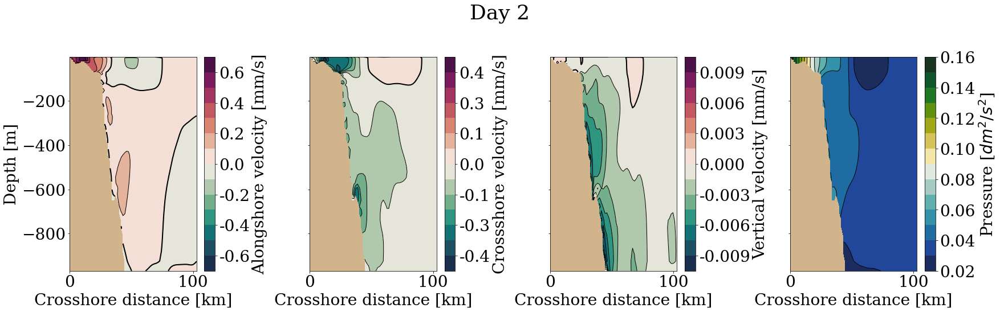

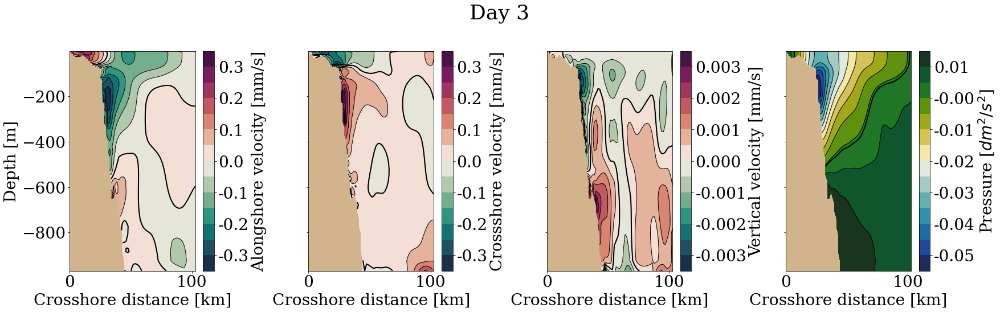

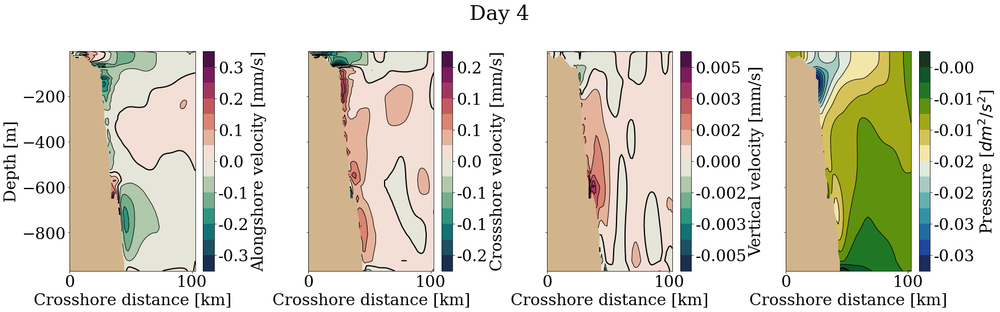

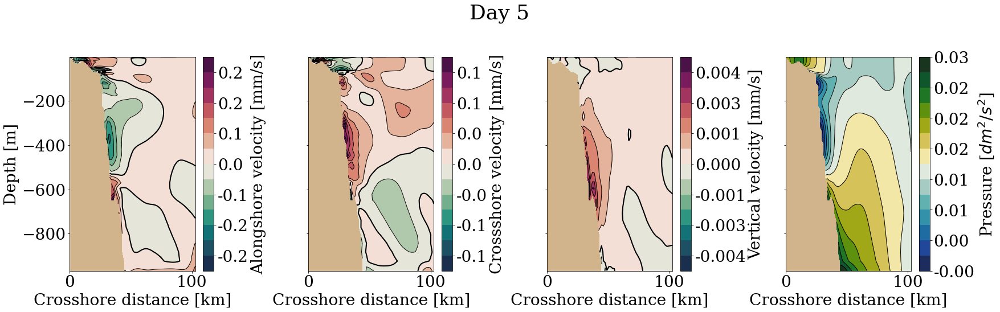

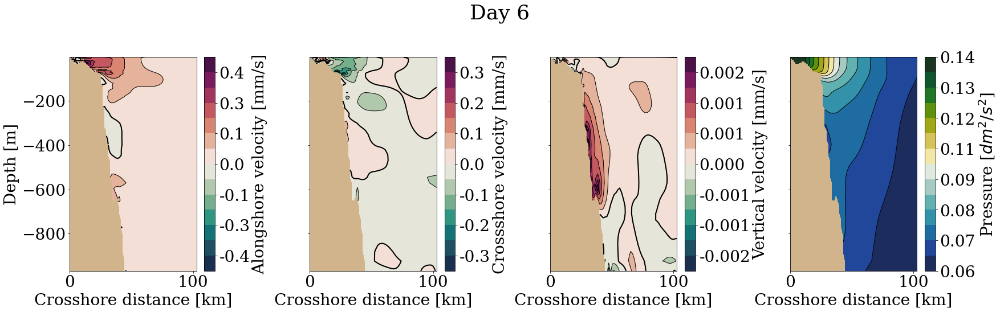

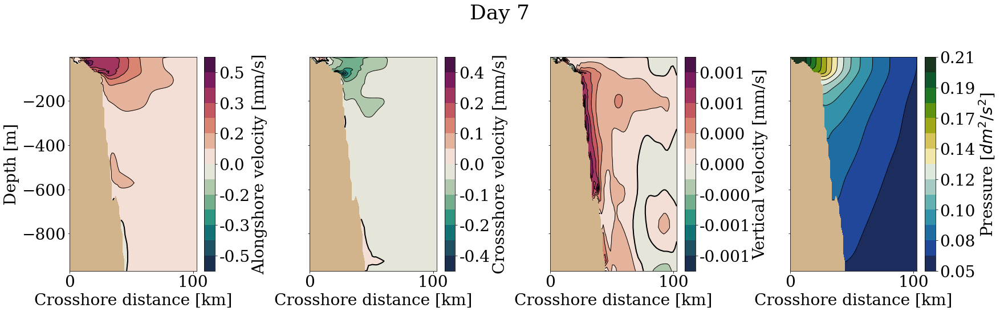

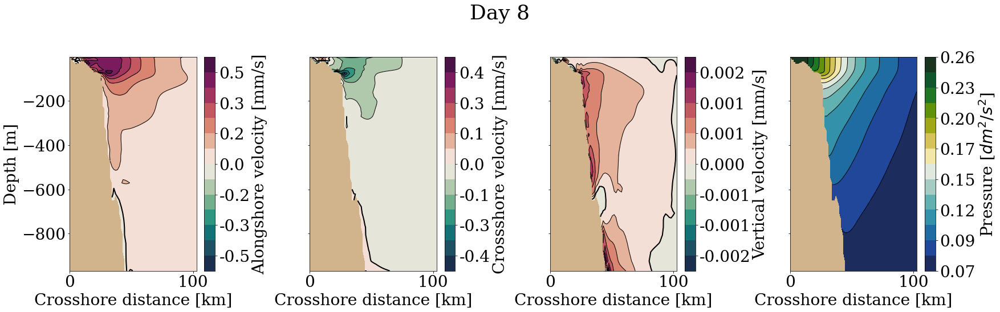

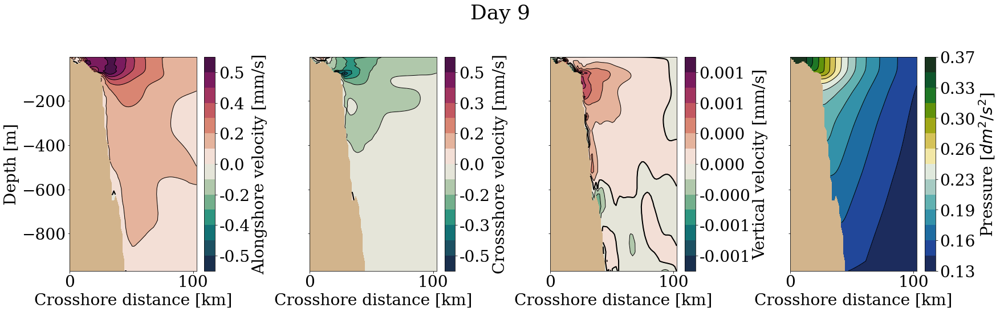

In [58]:
ind=220+50 #30.7° N
lon=30.7
unfilteredPLOT(dsw,dsn,ind,lon)


### Brink data

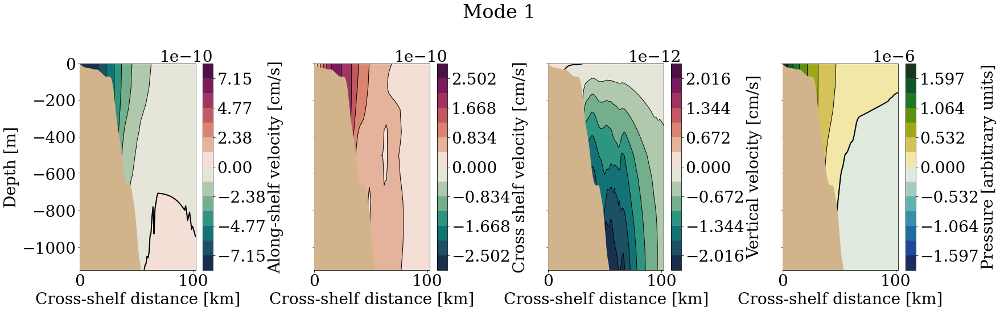

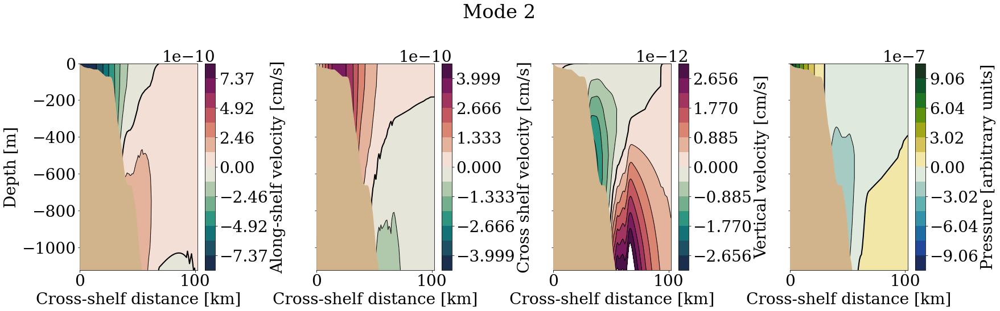

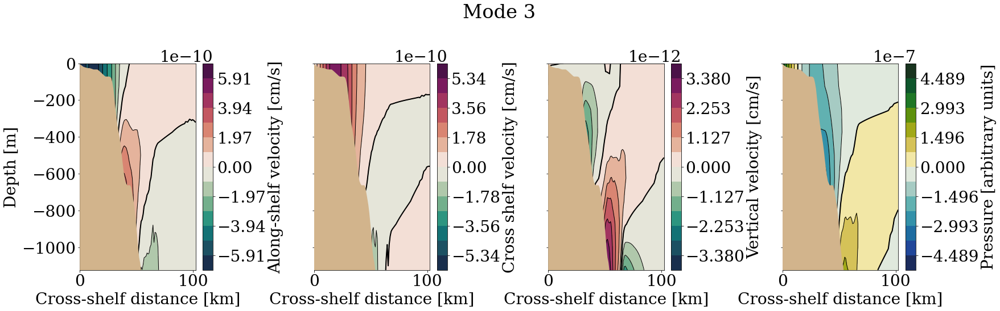

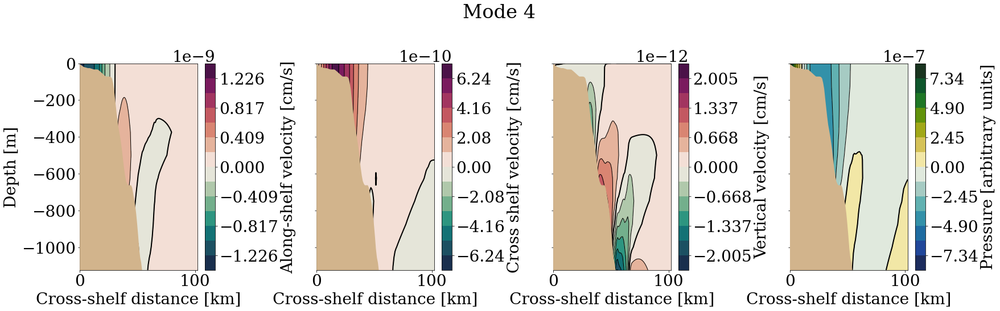

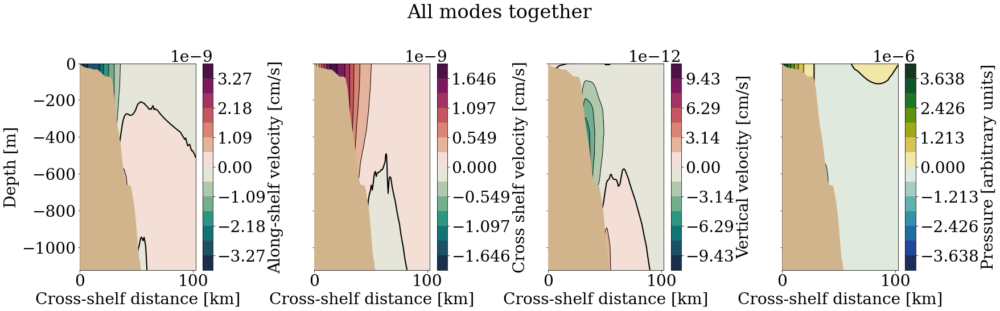

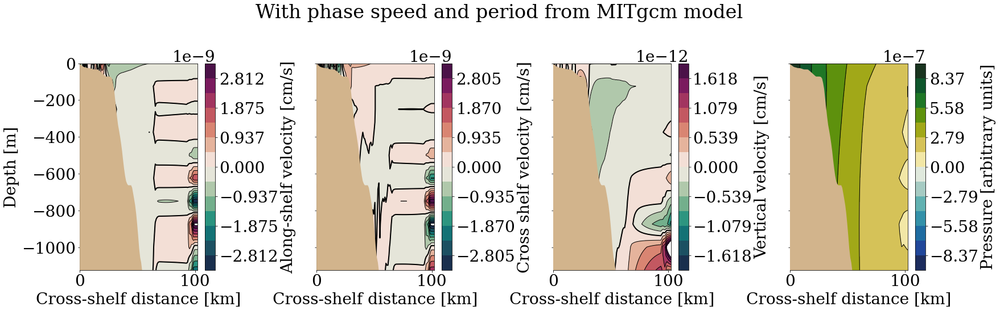

In [9]:
u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30.7mode1.mat')

fig1, ax = plt.subplots(1,4,sharey=True)
mode=1
fig1.suptitle('Mode 1')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig1.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30.7mode2.mat')

fig2, ax = plt.subplots(1,4,sharey=True)
mode=2
fig2.suptitle('Mode 2')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig2.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30.7mode3.mat')

fig3, ax = plt.subplots(1,4,sharey=True)
mode=3
fig3.suptitle('Mode 3')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig3.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB30.7mode4.mat')

fig4, ax = plt.subplots(1,4,sharey=True)
mode=4
fig4.suptitle('Mode 4')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig4.tight_layout()

u,v,w,r,p,z,k,f,xpl,xxx,zzz = get_Brinkallmodes2gether('dataSVB30.7mode1.mat','dataSVB30.7mode2.mat'
                                                       ,'dataSVB30.7mode3.mat','dataSVB30.7mode4.mat')
fig5, ax = plt.subplots(1,4,sharey=True)
mode='all'
fig5.suptitle('All modes together')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig5.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB3071.4mode1.mat')

fig6, ax = plt.subplots(1,4,sharey=True)
mode=2
fig6.suptitle('With phase speed and period from MITgcm model')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig6.tight_layout()


# 31.4 degrees north

### Filtered data

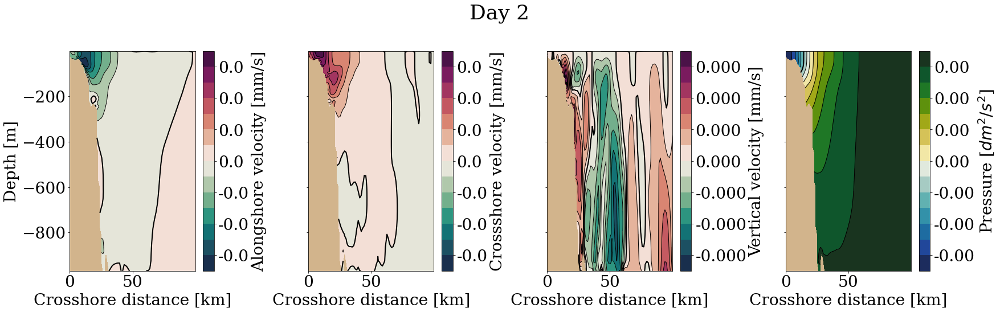

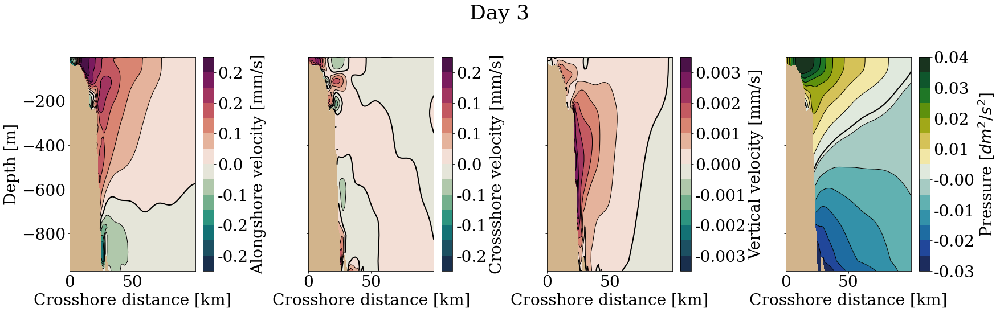

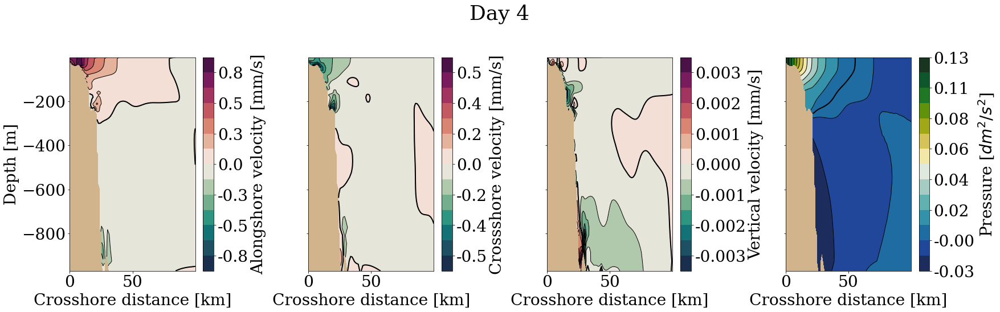

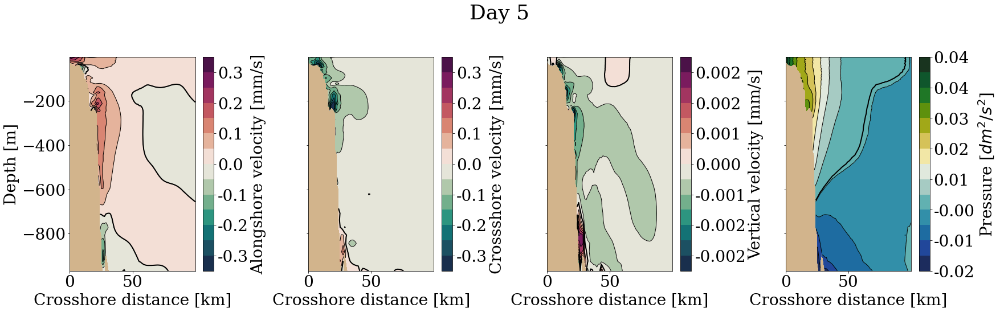

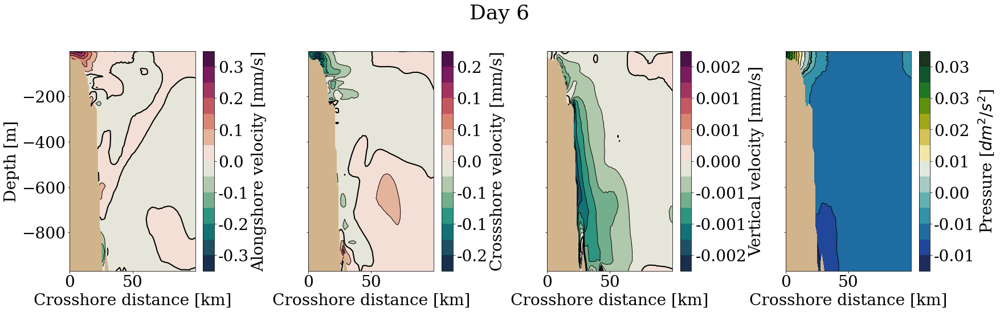

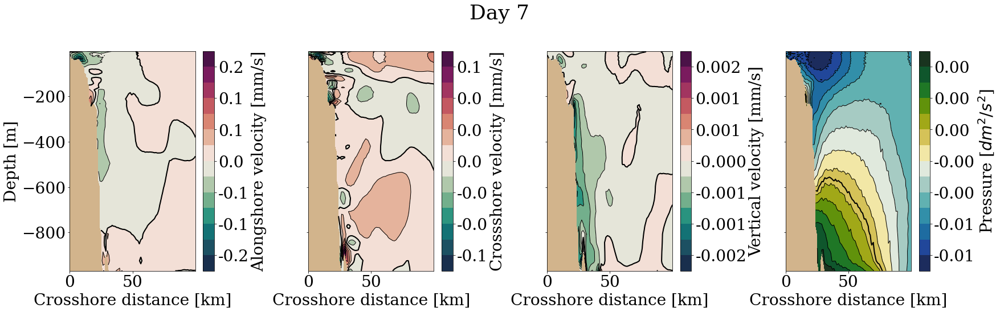

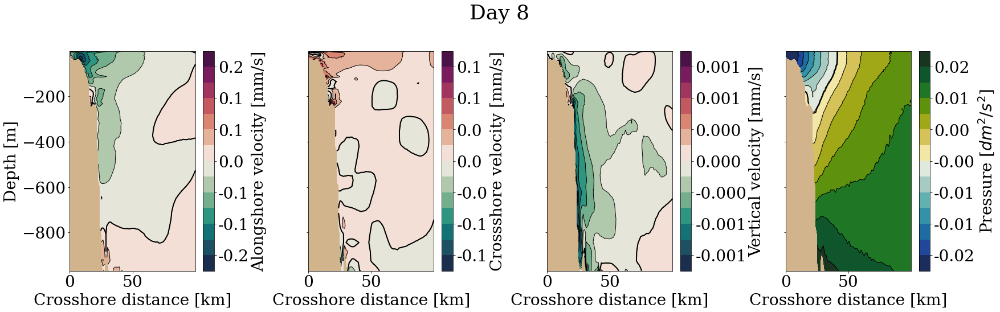

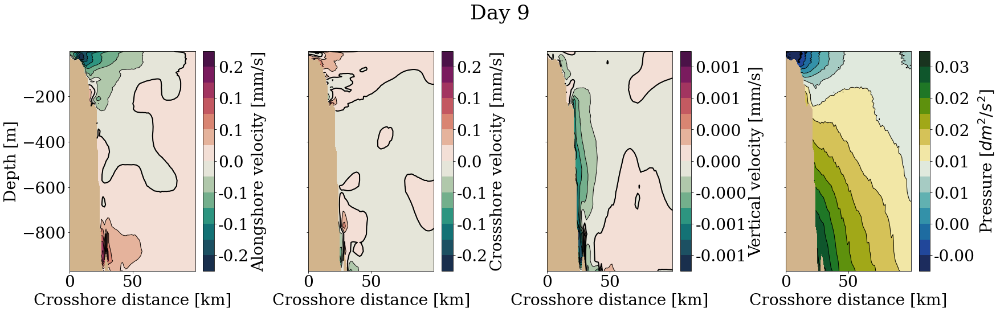

In [26]:
time0=0 #Day 2.5
time1=144 # Day 3.5
time2=288 # Day 4
time3=432 # Day 5
time4=504 #Day 6
time5=576 #Day 7 Day 8 for pressure
time6=648 #Day 8 Day 10 for pressure
time7=720 #Day 9

indlon30=np.arange(336,403,1)
indlon307=np.arange(289,385,1)
indlon314=np.arange(268,352,1)
indlon32=np.arange(264,333,1)

ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N

indlon=indlon314
ind=ind314
dist=dist314

#DEFINE IF IT IS FILTERED DATA OR NOT 
filt=1

tit=72

Ufilt=np.load("UVEL314filt.npy")
Wfilt=np.load("WVEL314filt.npy")
Vfilt=np.load("VVEL314filt.npy")
Pfilt314=np.load("PHIHYD314filt.npy")

fig0, ax = plt.subplots(1,4,sharey=True)
fig0.suptitle('Day 2', fontsize=36)
VALb=dsw[0].VVEL
VALn=dsn[0].VVEL

WALb=dsw[0].WVEL
WALn=dsn[0].WVEL

UALb=dsw[0].UVEL
UALn=dsn[0].UVEL

WAL=Wfilt[tit*0,:,:]
UAL=Ufilt[tit*0,:,:]
VAL=Vfilt[tit*0,:,:]
PAL=Pfilt314[tit*0,:,:]

PALb=0
PALn=0
PREFb=0
PREFn=0

plot_vel(time0,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig0,ax,3,VAL,UAL,WAL,PAL,filt)
fig0.tight_layout()

fig1, ax = plt.subplots(1,4,sharey=True)
fig1.suptitle('Day 3', fontsize=36)
VALb=dsw[1].VVEL
VALn=dsn[1].VVEL

WALb=dsw[1].WVEL
WALn=dsn[1].WVEL

UALb=dsw[1].UVEL
UALn=dsn[1].UVEL

WAL=Wfilt[tit*1,:,:]
UAL=Ufilt[tit*1,:,:]
VAL=Vfilt[tit*1,:,:]
PAL=Pfilt314[tit*1,:,:]

plot_vel(time1,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig1,ax,3,VAL,UAL,WAL,PAL,filt)
fig1.tight_layout()

fig2, ax = plt.subplots(1,4,sharey=True)
fig2.suptitle('Day 4', fontsize=36)
VALb=dsw[2].VVEL
VALn=dsn[2].VVEL

WALb=dsw[2].WVEL
WALn=dsn[2].WVEL

UALb=dsw[2].UVEL
UALn=dsn[2].UVEL

WAL=Wfilt[tit*2,:,:]
UAL=Ufilt[tit*2,:,:]
VAL=Vfilt[tit*2,:,:]
PAL=Pfilt314[tit*2,:,:]

plot_vel(time2,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig2,ax,3,VAL,UAL,WAL,PAL,filt)
fig2.tight_layout()

fig3, ax = plt.subplots(1,4,sharey=True)
fig3.suptitle('Day 5', fontsize=36)
VALb=dsw[3].VVEL
VALn=dsn[3].VVEL

WALb=dsw[3].WVEL
WALn=dsn[3].WVEL

UALb=dsw[3].UVEL
UALn=dsn[3].UVEL

WAL=Wfilt[tit*3,:,:]
UAL=Ufilt[tit*3,:,:]
VAL=Vfilt[tit*3,:,:]
PAL=Pfilt314[tit*3,:,:]

plot_vel(time3,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig3,ax,3,VAL,UAL,WAL,PAL,filt)
fig3.tight_layout()

fig4, ax = plt.subplots(1,4,sharey=True)
fig4.suptitle('Day 6', fontsize=36)
VALb=dsw[4].VVEL
VALn=dsn[4].VVEL

WALb=dsw[4].WVEL
WALn=dsn[4].WVEL

UALb=dsw[4].UVEL
UALn=dsn[4].UVEL

WAL=Wfilt[tit*4,:,:]
UAL=Ufilt[tit*4,:,:]
VAL=Vfilt[tit*4,:,:]
PAL=Pfilt314[tit*4,:,:]


plot_vel(time4,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig4,ax,3,VAL,UAL,WAL,PAL,filt)
fig4.tight_layout()


fig5, ax = plt.subplots(1,4,sharey=True)
fig5.suptitle('Day 7', fontsize=36)
VALb=dsw[5].VVEL
VALn=dsn[5].VVEL

WALb=dsw[5].WVEL
WALn=dsn[5].WVEL

UALb=dsw[5].UVEL
UALn=dsn[5].UVEL

WAL=Wfilt[tit*5,:,:]
UAL=Ufilt[tit*5,:,:]
VAL=Vfilt[tit*5,:,:]
PAL=Pfilt314[tit*5,:,:]

plot_vel(time5,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig5,ax,3,VAL,UAL,WAL,PAL,filt)
fig5.tight_layout()

fig6, ax = plt.subplots(1,4,sharey=True)
fig6.suptitle('Day 8', fontsize=36)
VALb=dsw[6].VVEL
VALn=dsn[6].VVEL

WALb=dsw[6].WVEL
WALn=dsn[6].WVEL

UALb=dsw[6].UVEL
UALn=dsn[6].UVEL

WAL=Wfilt[tit*6,:,:]
UAL=Ufilt[tit*6,:,:]
VAL=Vfilt[tit*6,:,:]
PAL=Pfilt314[tit*6,:,:]

plot_vel(time6,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig6,ax,3,VAL,UAL,WAL,PAL,filt)
fig6.tight_layout()

fig7, ax = plt.subplots(1,4,sharey=True)
fig7.suptitle('Day 9', fontsize=36)
VALb=dsw[7].VVEL
VALn=dsn[7].VVEL

WALb=dsw[7].WVEL
WALn=dsn[7].WVEL

UALb=dsw[7].UVEL
UALn=dsn[7].UVEL

WAL=Wfilt[tit*7,:,:]
UAL=Ufilt[tit*7,:,:]
VAL=Vfilt[tit*7,:,:]
PAL=Pfilt314[tit*7,:,:]

plot_vel(time7,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig7,ax,3,VAL,UAL,WAL,PAL,filt)
fig7.tight_layout()

### Unfiltered data

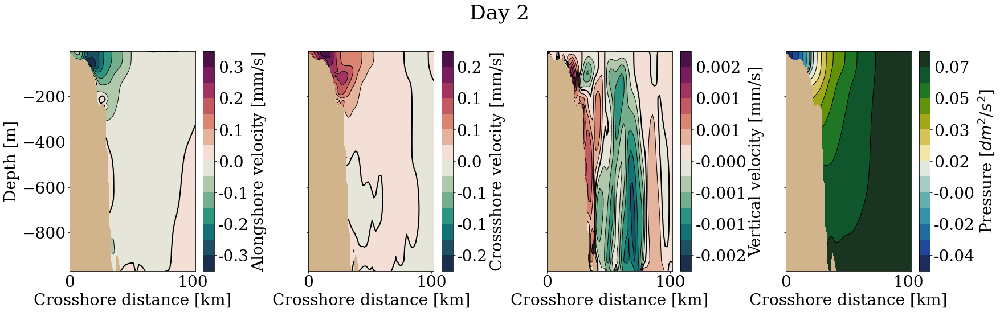

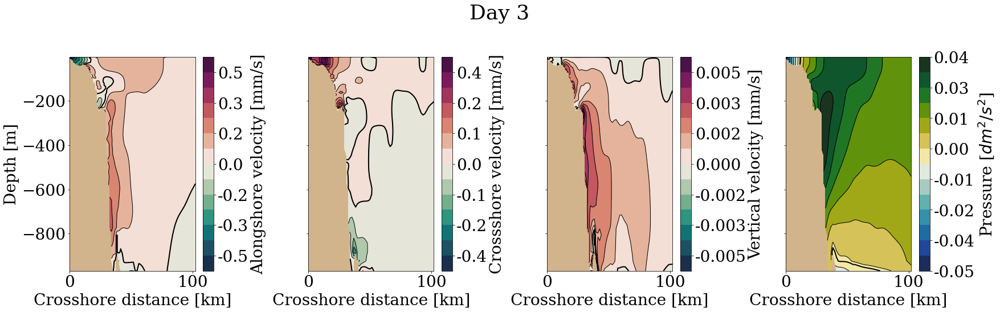

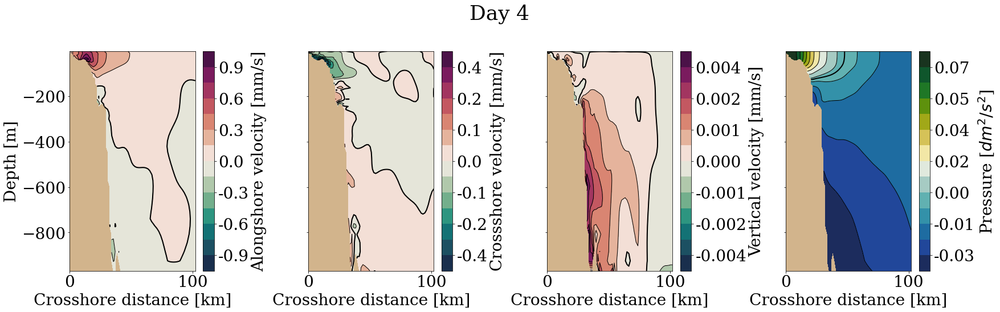

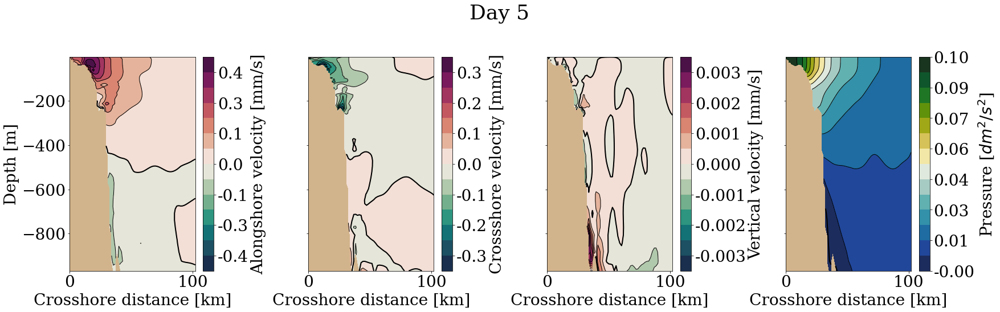

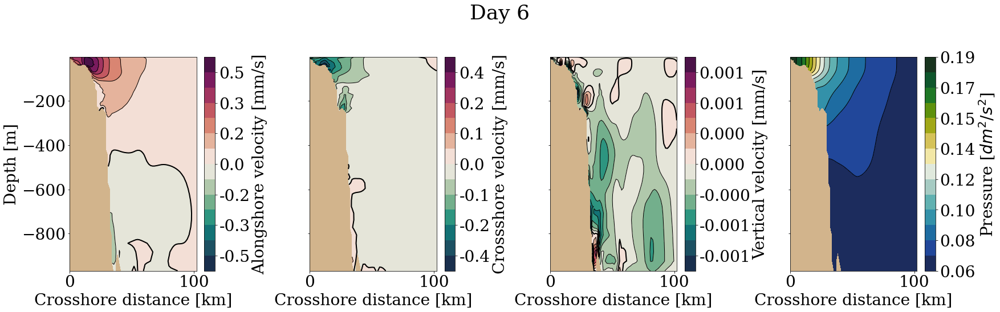

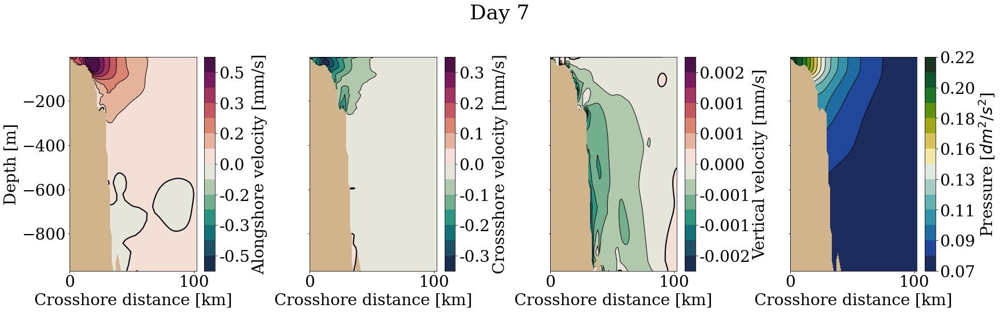

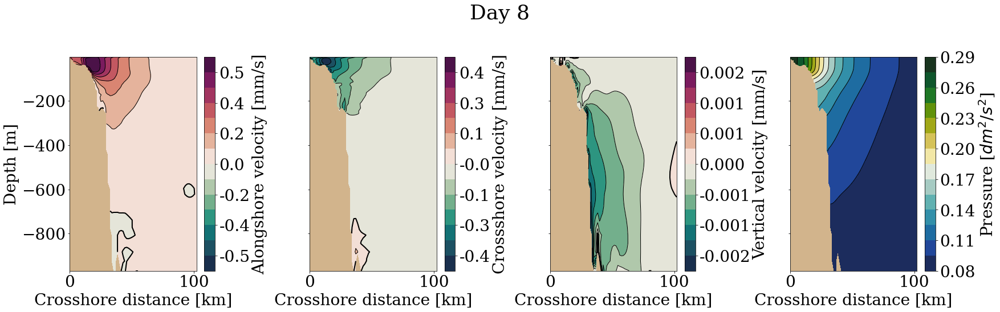

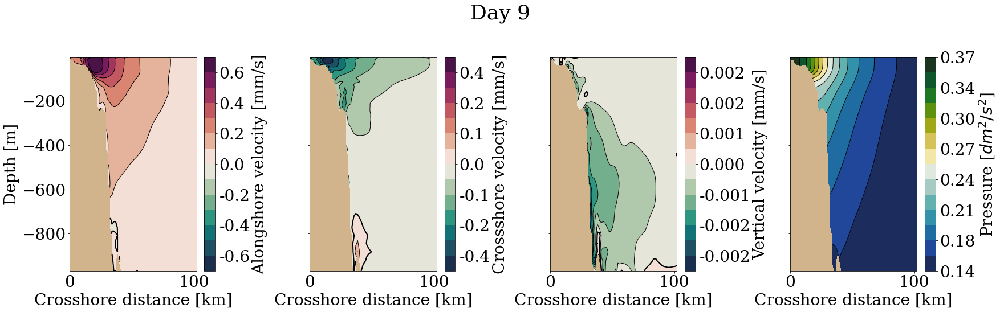

In [59]:
ind=220+100 #31.4° N
lon=31.4
unfilteredPLOT(dsw,dsn,ind,lon)


### Brink data

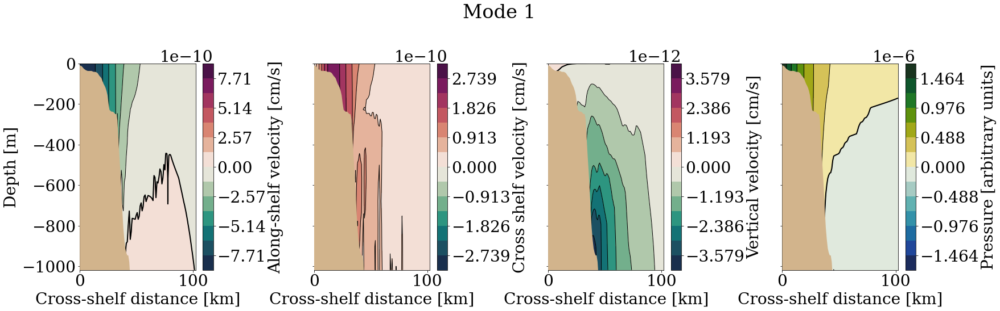

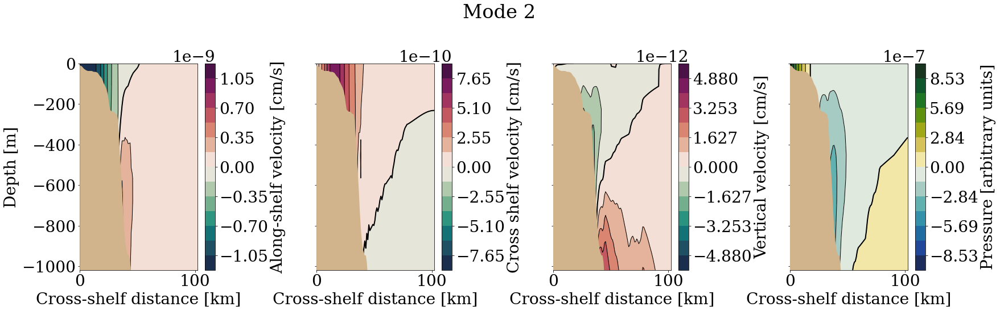

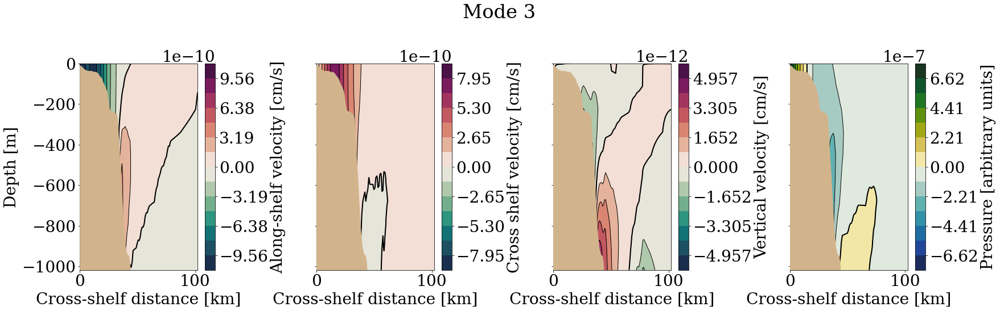

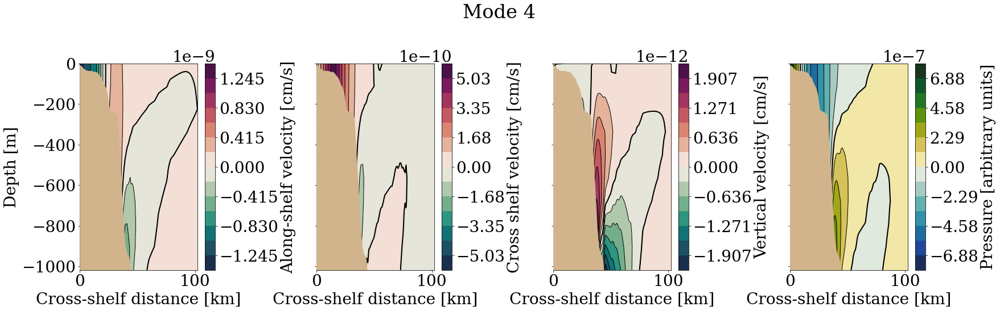

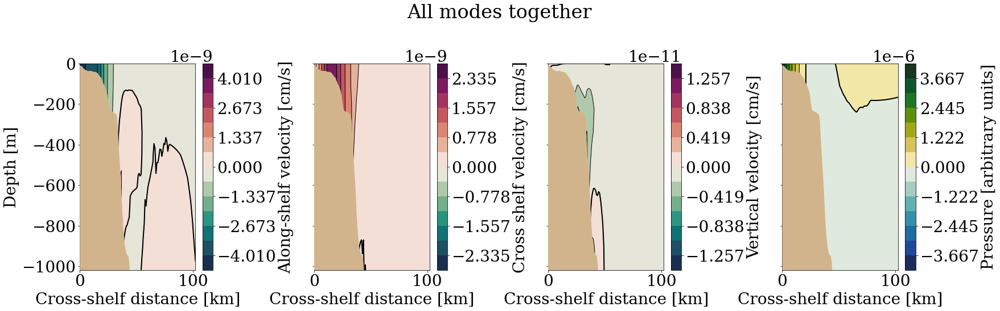

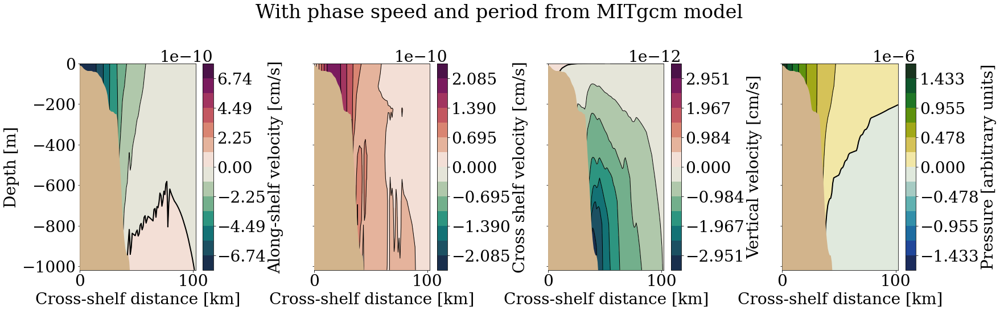

In [10]:
u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB31.4mode1.mat')

fig1, ax = plt.subplots(1,4,sharey=True)
mode=1
fig1.suptitle('Mode 1')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig1.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB31.4mode2.mat')

fig2, ax = plt.subplots(1,4,sharey=True)
mode=2
fig2.suptitle('Mode 2')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig2.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB31.4mode3.mat')

fig3, ax = plt.subplots(1,4,sharey=True)
mode=3
fig3.suptitle('Mode 3')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig3.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB31.4mode4.mat')

fig4, ax = plt.subplots(1,4,sharey=True)
mode=4
fig4.suptitle('Mode 4')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig4.tight_layout()

u,v,w,r,p,z,k,f,xpl,xxx,zzz = get_Brinkallmodes2gether('dataSVB31.4mode1.mat','dataSVB31.4mode2.mat'
                                                       ,'dataSVB31.4mode3.mat','dataSVB31.4mode4.mat')
fig5, ax = plt.subplots(1,4,sharey=True)
mode='all'
fig5.suptitle('All modes together')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig5.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB3141.4mode1.mat')

fig6, ax = plt.subplots(1,4,sharey=True)
mode=3
fig6.suptitle('With phase speed and period from MITgcm model')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig6.tight_layout()

# 32 degrees north

### Filtered data

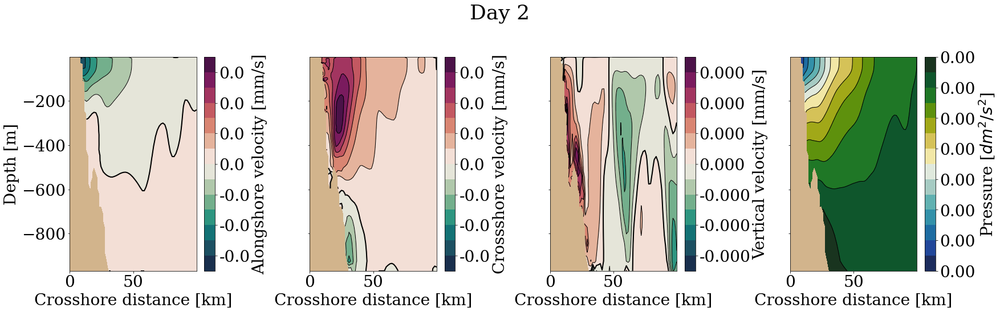

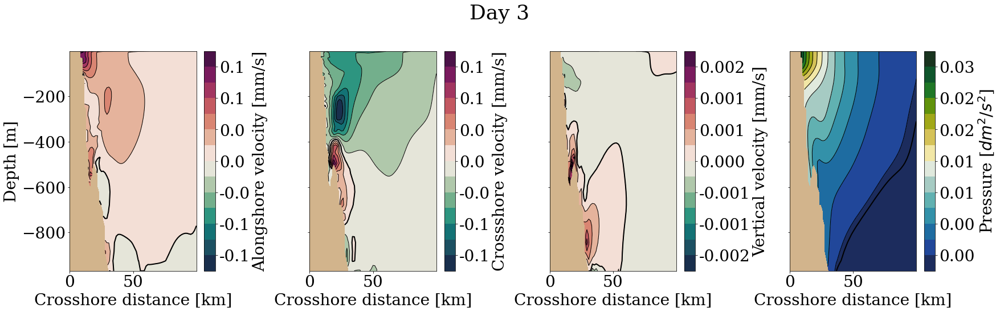

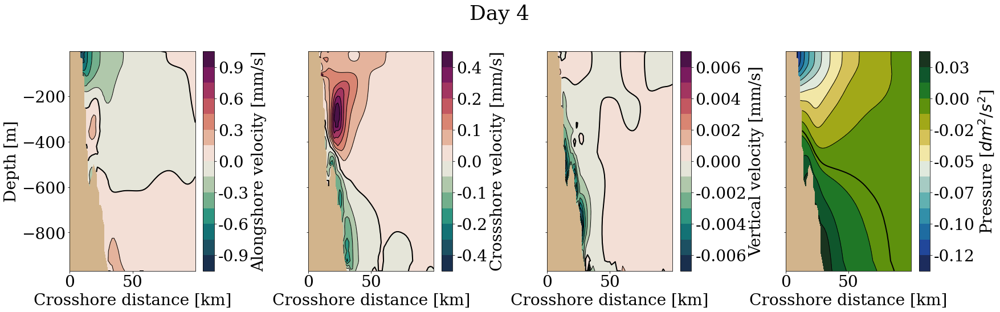

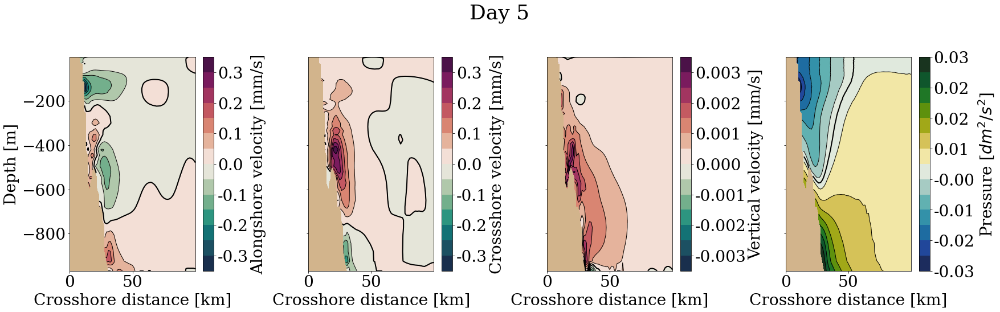

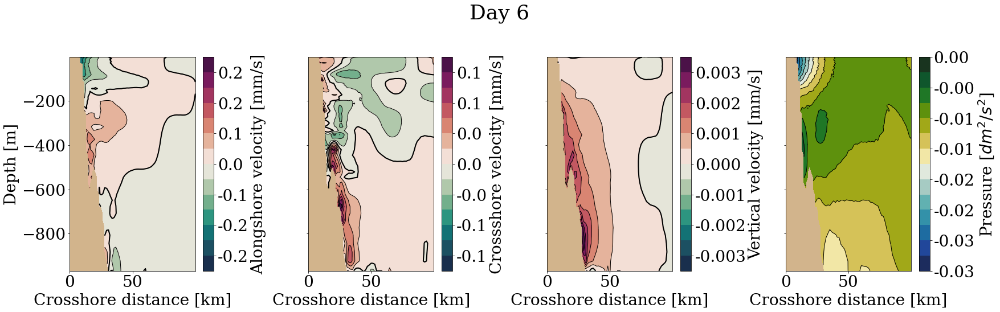

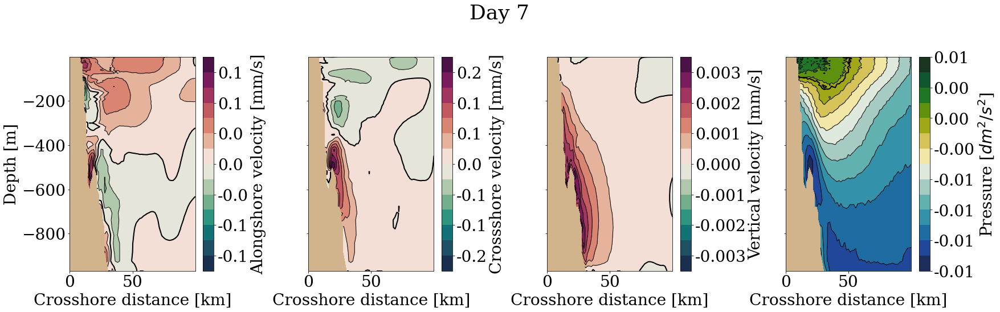

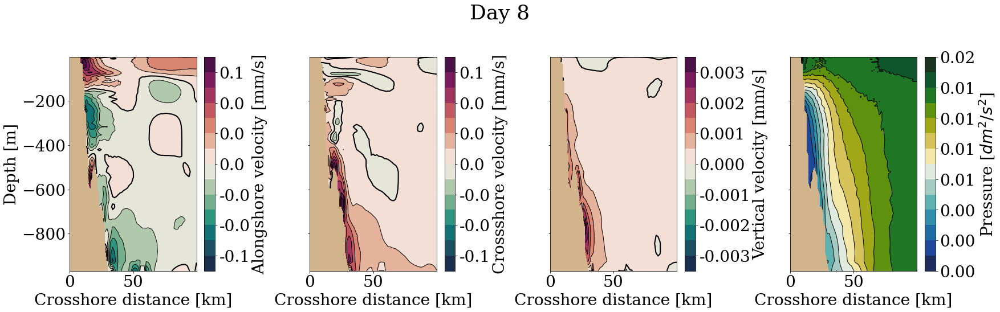

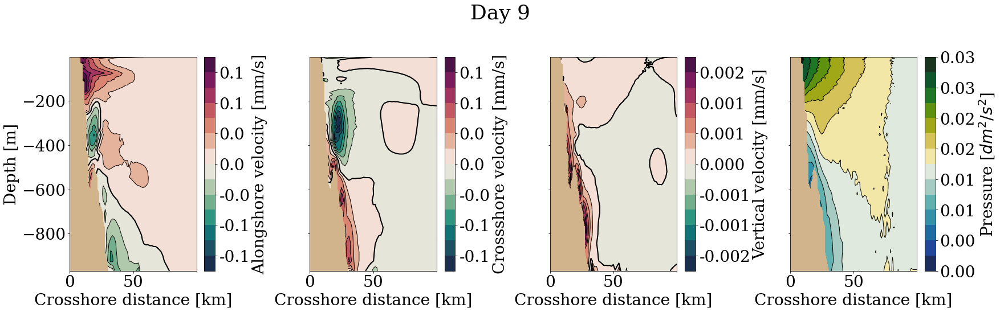

In [27]:
time0=0 #Day 2.5
time1=144 # Day 3.5
time2=288 # Day 4
time3=432 # Day 5
time4=504 #Day 6
time5=576 #Day 7 Day 8 for pressure
time6=648 #Day 8 Day 10 for pressure
time7=720 #Day 9

indlon30=np.arange(336,403,1)
indlon307=np.arange(289,385,1)
indlon314=np.arange(268,352,1)
indlon32=np.arange(264,333,1)

ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N

indlon=indlon32
ind=ind32
dist=dist32

#DEFINE IF IT IS FILTERED DATA OR NOT 
filt=1

tit=72

Ufilt=np.load("UVEL32filt.npy")
Wfilt=np.load("WVEL32filt.npy")
Vfilt=np.load("VVEL32filt.npy")
Pfilt32=np.load("PHIHYD32filt.npy")

fig0, ax = plt.subplots(1,4,sharey=True)
fig0.suptitle('Day 2', fontsize=36)
VALb=dsw[0].VVEL
VALn=dsn[0].VVEL

WALb=dsw[0].WVEL
WALn=dsn[0].WVEL

UALb=dsw[0].UVEL
UALn=dsn[0].UVEL

WAL=Wfilt[tit*0,:,:]
UAL=Ufilt[tit*0,:,:]
VAL=Vfilt[tit*0,:,:]
PAL=Pfilt32[tit*0,:,:]

PALb=0
PALn=0
PREFb=0
PREFn=0

plot_vel(time0,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig0,ax,4,VAL,UAL,WAL,PAL,filt)
fig0.tight_layout()

fig1, ax = plt.subplots(1,4,sharey=True)
fig1.suptitle('Day 3', fontsize=36)
VALb=dsw[1].VVEL
VALn=dsn[1].VVEL

WALb=dsw[1].WVEL
WALn=dsn[1].WVEL

UALb=dsw[1].UVEL
UALn=dsn[1].UVEL

WAL=Wfilt[tit*1,:,:]
UAL=Ufilt[tit*1,:,:]
VAL=Vfilt[tit*1,:,:]
PAL=Pfilt32[tit*1,:,:]

plot_vel(time1,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig1,ax,4,VAL,UAL,WAL,PAL,filt)
fig1.tight_layout()

fig2, ax = plt.subplots(1,4,sharey=True)
fig2.suptitle('Day 4', fontsize=36)
VALb=dsw[2].VVEL
VALn=dsn[2].VVEL

WALb=dsw[2].WVEL
WALn=dsn[2].WVEL

UALb=dsw[2].UVEL
UALn=dsn[2].UVEL

WAL=Wfilt[tit*2,:,:]
UAL=Ufilt[tit*2,:,:]
VAL=Vfilt[tit*2,:,:]
PAL=Pfilt32[tit*2,:,:]

plot_vel(time2,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig2,ax,4,VAL,UAL,WAL,PAL,filt)
fig2.tight_layout()

fig3, ax = plt.subplots(1,4,sharey=True)
fig3.suptitle('Day 5', fontsize=36)
VALb=dsw[3].VVEL
VALn=dsn[3].VVEL

WALb=dsw[3].WVEL
WALn=dsn[3].WVEL

UALb=dsw[3].UVEL
UALn=dsn[3].UVEL

WAL=Wfilt[tit*3,:,:]
UAL=Ufilt[tit*3,:,:]
VAL=Vfilt[tit*3,:,:]
PAL=Pfilt32[tit*3,:,:]

plot_vel(time3,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig3,ax,4,VAL,UAL,WAL,PAL,filt)
fig3.tight_layout()

fig4, ax = plt.subplots(1,4,sharey=True)
fig4.suptitle('Day 6', fontsize=36)
VALb=dsw[4].VVEL
VALn=dsn[4].VVEL

WALb=dsw[4].WVEL
WALn=dsn[4].WVEL

UALb=dsw[4].UVEL
UALn=dsn[4].UVEL

WAL=Wfilt[tit*4,:,:]
UAL=Ufilt[tit*4,:,:]
VAL=Vfilt[tit*4,:,:]
PAL=Pfilt32[tit*4,:,:]

plot_vel(time4,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig4,ax,4,VAL,UAL,WAL,PAL,filt)
fig4.tight_layout()


fig5, ax = plt.subplots(1,4,sharey=True)
fig5.suptitle('Day 7', fontsize=36)
VALb=dsw[5].VVEL
VALn=dsn[5].VVEL

WALb=dsw[5].WVEL
WALn=dsn[5].WVEL

UALb=dsw[5].UVEL
UALn=dsn[5].UVEL

WAL=Wfilt[tit*5,:,:]
UAL=Ufilt[tit*5,:,:]
VAL=Vfilt[tit*5,:,:]
PAL=Pfilt32[tit*5,:,:]

plot_vel(time5,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig5,ax,4,VAL,UAL,WAL,PAL,filt)
fig5.tight_layout()

fig6, ax = plt.subplots(1,4,sharey=True)
fig6.suptitle('Day 8', fontsize=36)
VALb=dsw[6].VVEL
VALn=dsn[6].VVEL

WALb=dsw[6].WVEL
WALn=dsn[6].WVEL

UALb=dsw[6].UVEL
UALn=dsn[6].UVEL

WAL=Wfilt[tit*6,:,:]
UAL=Ufilt[tit*6,:,:]
VAL=Vfilt[tit*6,:,:]
PAL=Pfilt32[tit*6,:,:]

plot_vel(time6,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig6,ax,4,VAL,UAL,WAL,PAL,filt)
fig6.tight_layout()

fig7, ax = plt.subplots(1,4,sharey=True)
fig7.suptitle('Day 9', fontsize=36)
VALb=dsw[7].VVEL
VALn=dsn[7].VVEL

WALb=dsw[7].WVEL
WALn=dsn[7].WVEL

UALb=dsw[7].UVEL
UALn=dsn[7].UVEL

WAL=Wfilt[tit*7,:,:]
UAL=Ufilt[tit*7,:,:]
VAL=Vfilt[tit*7,:,:]
PAL=Pfilt32[tit*7,:,:]

plot_vel(time7,dist,Z,VALb,VALn,WALb,WALn,UALb,UALn,PALb,PALn,PREFb,PREFn,indlon,ind,fig7,ax,4,VAL,UAL,WAL,PAL,filt)
fig7.tight_layout()

### Unfiltered data

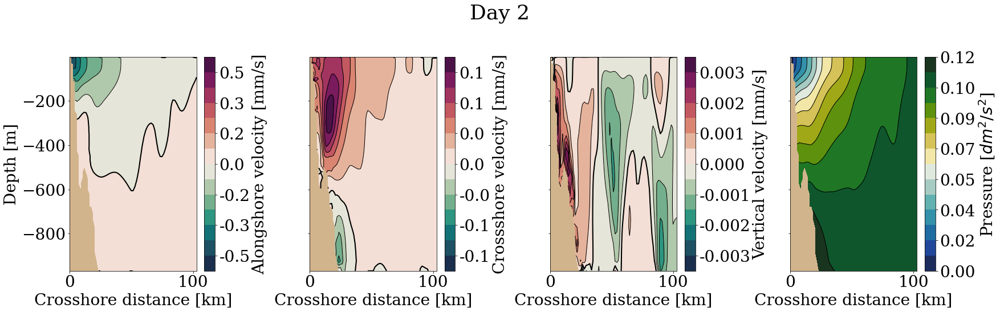

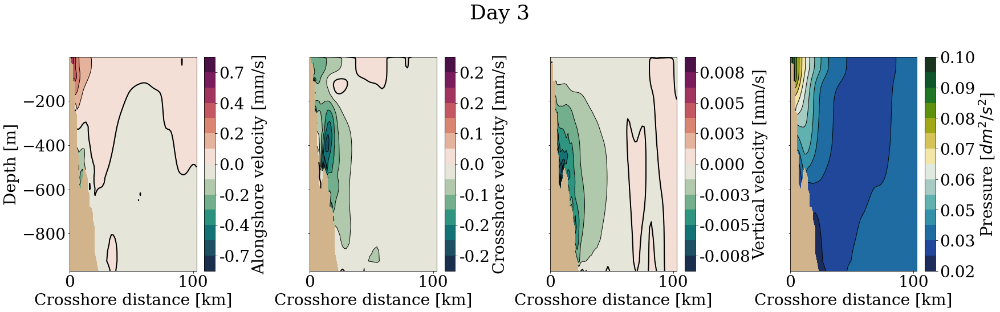

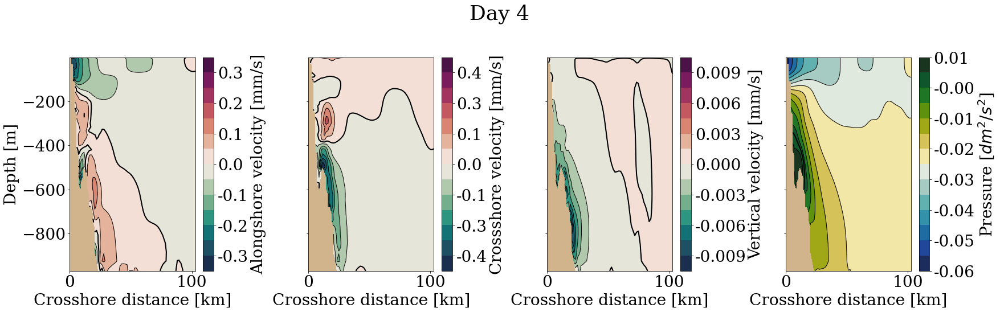

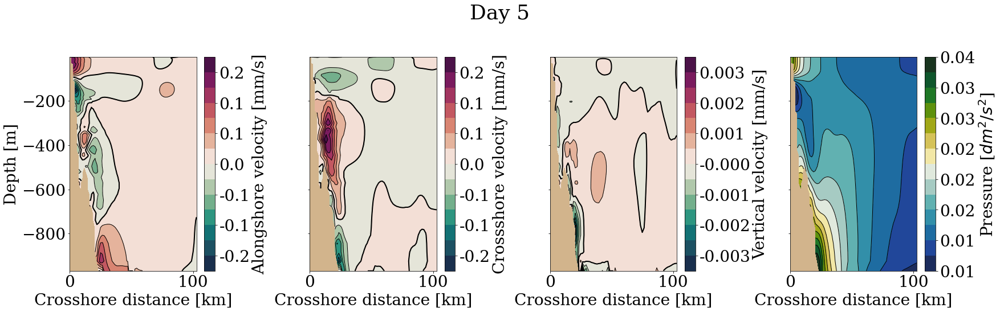

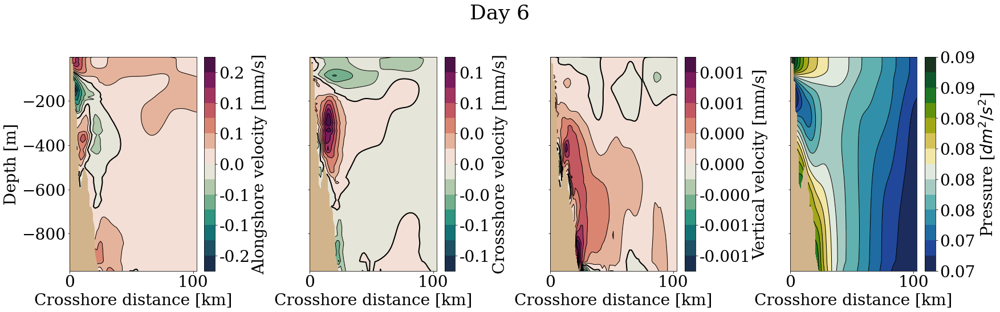

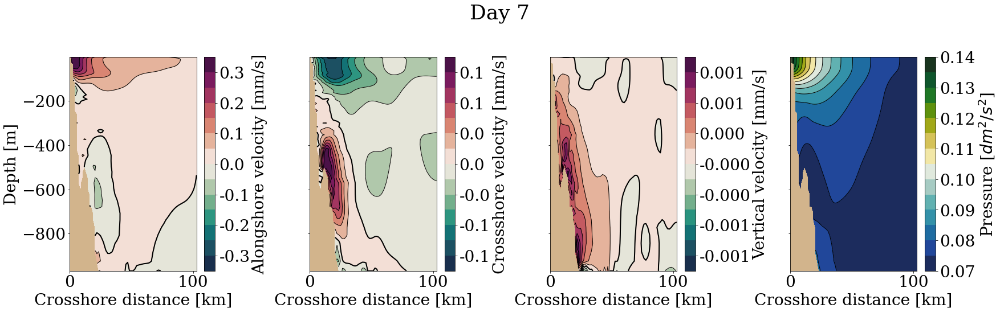

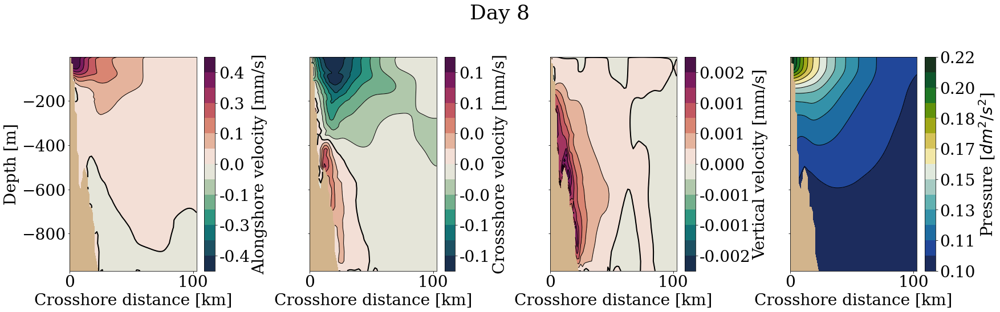

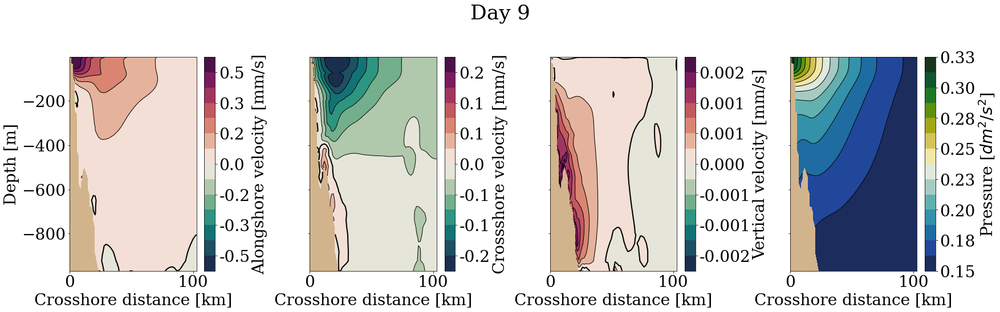

In [60]:
ind=220+150 #32° N
lon=32
unfilteredPLOT(dsw,dsn,ind,lon)

### Brink data

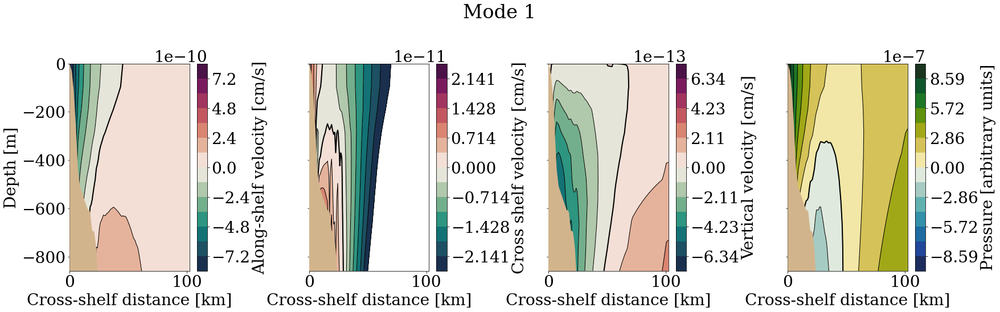

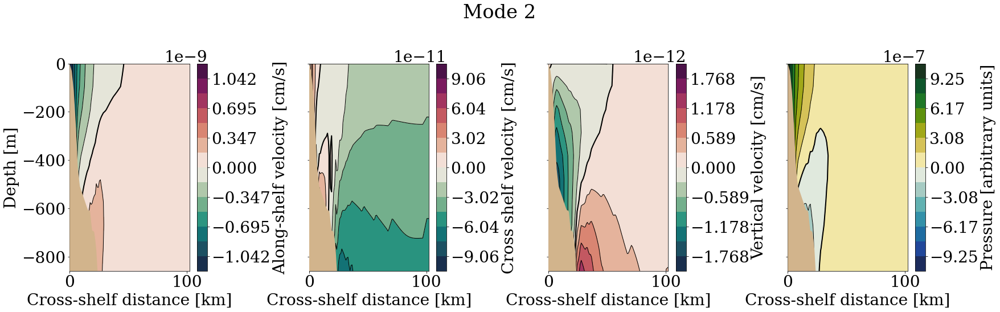

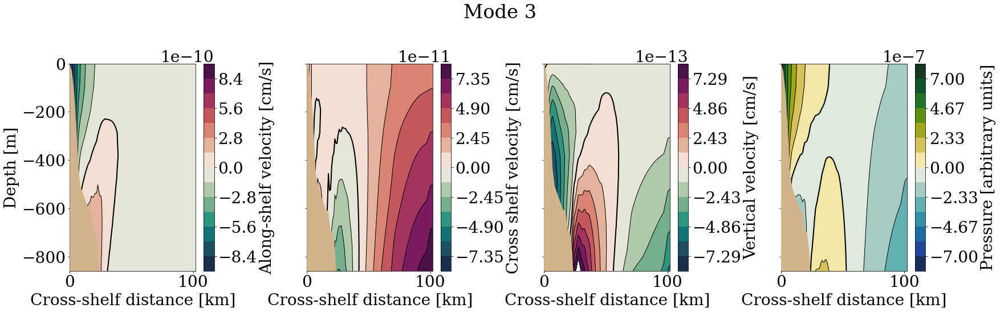

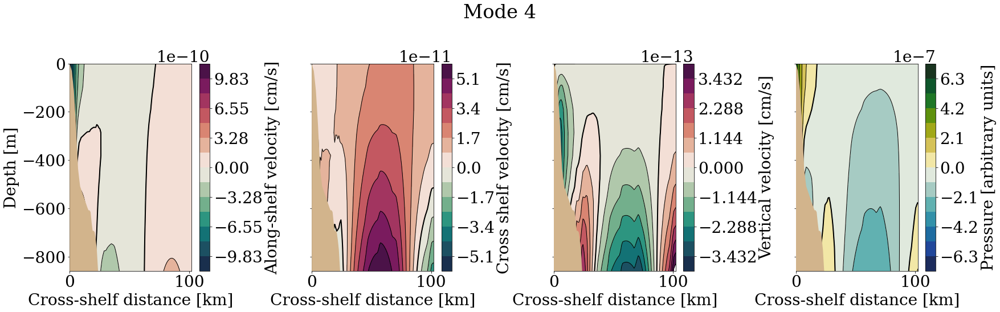

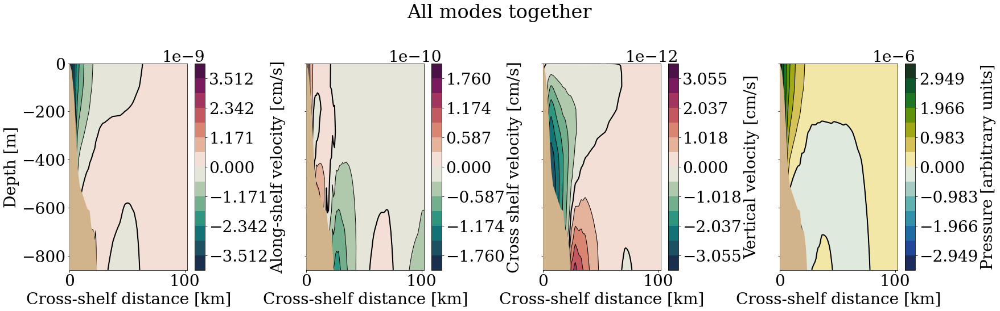

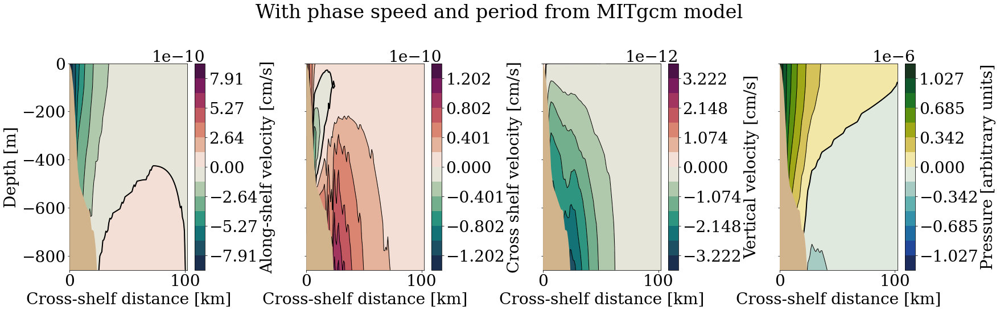

In [11]:
u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB32mode1.mat')

fig1, ax = plt.subplots(1,4,sharey=True)
mode=1
fig1.suptitle('Mode 1')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig1.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB32mode2.mat')

fig2, ax = plt.subplots(1,4,sharey=True)
mode=2
fig2.suptitle('Mode 2')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig2.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB32mode3.mat')

fig3, ax = plt.subplots(1,4,sharey=True)
mode=3
fig3.suptitle('Mode 3')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig3.tight_layout()

u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB32mode4.mat')

fig4, ax = plt.subplots(1,4,sharey=True)
mode=4
fig4.suptitle('Mode 4')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig4.tight_layout()

u,v,w,r,p,z,k,f,xpl,xxx,zzz = get_Brinkallmodes2gether('dataSVB32mode1.mat','dataSVB32mode2.mat'
                                                       ,'dataSVB32mode3.mat','dataSVB32mode4.mat')
fig5, ax = plt.subplots(1,4,sharey=True)
mode='all'
fig5.suptitle('All modes together')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig5.tight_layout()


u,v,w,r,p,z,k,omega,xpl, xxx, zzz = get_Brink('dataSVB321.4mode1.mat')

fig6, ax = plt.subplots(1,4,sharey=True)
mode=4
fig6.suptitle('With phase speed and period from MITgcm model')
minp = -np.nanmax(p)
maxp = np.nanmax(p)
plot_Brink(ax[0], ax[1], ax[2],ax[3], u.imag[8:,:], v[8:,:],w.imag[8:,:], p[8:,:], z[8:], xpl, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig6.tight_layout()

# Only pressure all modes 30 °N

In [9]:
def plot_Brinkallmodes(ax2,ax3,ax4,ax5,u,v,w,p,z,xpl,xxx,zzz,minp,maxp,nlev=15):
    landc='tan'
    ymin=-1000
    levels=np.linspace(minp,maxp,nlev)
    p5 = ax5.contourf(xpl, z, p, levels=levels, cmap=cmo.cm.delta, vmin=minp, 
                      vmax=maxp, zorder=1)
    ax5.contour(xpl, z, p, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    #ax5.contour(xpl, z, p, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax5.set_facecolor('tan')
    ax5.set_ylim([-1000,0])
    
    cbar3 = plt.colorbar(p5,ax=ax5)
    cbar3.set_label('Pressure  [arbitrary units]')

  
    p4 = ax4.contourf(xpl, z, w, levels=levels, cmap=cmo.cm.delta, vmin=minp, 
                      vmax=maxp, zorder=1)
    ax4.contour(xpl, z, w, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    #ax4.contour(xpl, z, w, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax4.set_facecolor('tan')
    ax4.set_ylim([-1000,0])
    
    
    
    p2 = ax2.contourf(xpl, z,  v, levels=levels, cmap=cmo.cm.delta, vmin=minp, 
                      vmax=maxp, zorder=1)
    ax2.contour(xpl, z, v, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    #ax2.contour(xpl, z, v, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax2.set_facecolor('tan')
    ax2.set_ylim([-1000,0])

 
    p3 = ax3.contourf(xpl, z, u, levels=levels, cmap=cmo.cm.delta, vmin=minp, 
                      vmax=maxp, zorder=1)
    ax3.contour(xpl, z, u, levels=[0], linewidths=2, linestyles='-', colors='k', zorder=2)
    #ax3.contour(xpl, z, u, levels=levels, linewidths=1, linestyles='-', colors='k', zorder=2)
    ax3.set_facecolor('tan')
    ax3.set_ylim([-1000,0])
    

In [7]:
params = {'font.size': 28,
          'figure.figsize': (25, 8),
         'font.family':'serif'}
pl.rcParams.update(params)

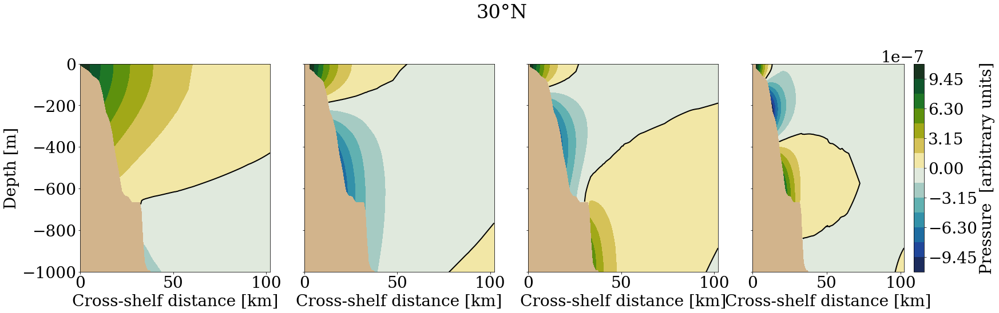

In [10]:
u,v,w,r,p1,z,k,omega,xpl, xxx, zzz,zgr,xgr,h = get_Brink('dataSVB30mode1.mat','h30.mat')
u,v,w,r,p2,z,k,omega,xpl, xxx, zzz,zgr,xgr,h = get_Brink('dataSVB30mode2.mat','h30.mat')
u,v,w,r,p3,z,k,omega,xpl, xxx, zzz,zgr,xgr,h = get_Brink('dataSVB30mode3.mat','h30.mat')
u,v,w,r,p4,z,k,omega,xpl, xxx, zzz,zgr,xgr,h = get_Brink('dataSVB30mode4.mat','h30.mat')

fig1, ax = plt.subplots(1,4,sharey=True)
mode=1
fig1.suptitle('30°N')
minp = -np.nanmax(p1)
maxp = np.nanmax(p1)
plot_Brinkallmodes(ax[0], ax[1], ax[2],ax[3], p2, p1,p3, p4, zgr, xgr, xxx, zzz, minp, maxp)

ax[0].set_ylabel('Depth [m]')
ax[0].set_xlabel('Cross-shelf distance [km]')
ax[1].set_xlabel('Cross-shelf distance [km]')
ax[2].set_xlabel('Cross-shelf distance [km]')
ax[3].set_xlabel('Cross-shelf distance [km]')
fig1.tight_layout()

